In [1]:
import pandas as pd, matplotlib.pyplot as plt, geopandas as gpd, contextily as ctx, numpy as np

In [2]:
rosetta0 = pd.read_csv(r"C:\Users\josef\Desktop\Hermes Winner\rosetta.csv")
rosetta0.columns

Index(['Unnamed: 0', 'PERSONA_REF_ID', 'HOGAR_REF_ID', 'SEXO', 'EDAD',
       'P_NACDAD', 'P_ALFAB', 'P_CONMPU', 'EDADAGRU', 'P_ASISTEDU',
       'P_NIVELED', 'P_COMPLED', 'CONDACT', 'VIVIENDA_REF_ID', 'H_MAT_PISO',
       'H_MAT_CUBTA', 'H_REVEST', 'H_AGUA', 'H_PROC_AGUA', 'BAÑO', 'H_LIMP_I',
       'H_DESAGUE_I', 'H_BAÑO_EXC', 'H_COMBUST', 'H_HABI_DOR', 'H_HABI_TOT',
       'HELADERA', 'H_COMPUTADORA', 'CELULAR', 'TELEFONO', 'PROP', 'INDHAC',
       'TOTPERS', 'ALGUNBI', 'RADIO_REF_ID', 'VV_TIPO', 'VV_PART', 'VV_OCUP',
       'VV_COLEC', 'VV_CALIDAD_SERVS', 'VV_CALIDAD_MAT', 'VV_CALIDAD_CONS',
       'IDDPTO', 'RADIO'],
      dtype='object')

In [3]:
rosetta = rosetta0.drop(['Unnamed: 0'], axis=1)
rosetta

,PERSONA_REF_ID,HOGAR_REF_ID,SEXO,EDAD,P_NACDAD,P_ALFAB,P_CONMPU,EDADAGRU,P_ASISTEDU,P_NIVELED,...,RADIO_REF_ID,VV_TIPO,VV_PART,VV_OCUP,VV_COLEC,VV_CALIDAD_SERVS,VV_CALIDAD_MAT,VV_CALIDAD_CONS,IDDPTO,RADIO
0,1,1,2,61,1,1,2,2,2,4,...,1,1,1,1,0,1,1,1,1,20010101
1,2,2,1,48,1,1,1,2,2,4,...,1,1,1,1,0,1,1,1,1,20010101
2,3,3,1,65,1,1,1,3,2,7,...,1,1,1,1,0,1,1,1,1,20010101
3,4,3,2,62,1,1,1,2,2,6,...,1,1,1,1,0,1,1,1,1,20010101
4,5,4,1,20,2,1,1,2,1,4,...,1,1,1,1,0,1,1,1,1,20010101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2890146,2890147,1152599,2,95,1,1,0,3,2,2,...,3553,2,0,0,1,0,0,0,15,20152113
2890147,2890148,1152599,2,91,1,1,0,3,2,6,...,3553,2,0,0,1,0,0,0,15,20152113
2890148,2890149,1152599,2,83,1,1,0,3,2,2,...,3553,2,0,0,1,0,0,0,15,20152113
2890149,2890150,1152599,2,89,1,1,0,3,2,2,...,3553,2,0,0,1,0,0,0,15,20152113


In [4]:
tabla_intermedia0 = pd.read_csv(R"C:\Users\josef\Desktop\Hermes Winner\BORRAR\tabla_intermedia.csv")

In [5]:
tabla_intermedia0.drop(["Unnamed: 0"], axis=1)
tabla_intermedia = tabla_intermedia0[["RADIO",	"circuito",	"RADIO.CIRCUITO"]]
tabla_intermedia["circuito"] = tabla_intermedia["circuito"].astype(str)

C:\Users\josef\AppData\Local\Temp\ipykernel_3964\1707172542.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla_intermedia["circuito"] = tabla_intermedia["circuito"].astype(str)


In [6]:
strp = tabla_intermedia["circuito"].str.pad(width=4, side="left", fillchar="0")
strp.to_frame()

,circuito
0,0005
1,0005
2,0005
3,0005
4,0005
...,...
3545,0158
3546,0158
3547,0158
3548,0158


In [7]:
tabla_intermedia['circuito'] = strp
#tabla_intermedia.to_csv('tabla_intermedia2.csv')
tabla_intermedia

C:\Users\josef\AppData\Local\Temp\ipykernel_3964\2577577587.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla_intermedia['circuito'] = strp


,RADIO,circuito,RADIO.CIRCUITO
0,20010101,0005,20010005
1,20010201,0005,20010005
2,20010202,0005,20010005
3,20010203,0005,20010005
4,20010204,0005,20010005
...,...,...,...
3545,20152109,0158,20150158
3546,20152110,0158,20150158
3547,20152111,0158,20150158
3548,20152112,0158,20150158


In [8]:
circuitos_geometria = gpd.read_file(R"C:\Users\josef\Desktop\Hermes Winner\BB.DD\CABA.shp")
circuitos_geometria = circuitos_geometria[["circuito",	"geometry"]]
circuitos_geometria

,circuito,geometry
0,0003,"POLYGON Z ((-6496304.252 -4084732.697 0.000, -..."
1,0045,"POLYGON Z ((-6501230.474 -4091702.182 0.000, -..."
2,0037,"POLYGON Z ((-6501166.688 -4087904.826 0.000, -..."
3,0018,"POLYGON Z ((-6498832.986 -4088373.028 0.000, -..."
4,0141,"POLYGON Z ((-6503862.400 -4078547.361 0.000, -..."
...,...,...
162,0135,"POLYGON Z ((-6507834.614 -4077215.626 0.000, -..."
163,0149,"POLYGON Z ((-6503253.371 -4080723.227 0.000, -..."
164,0101,"POLYGON Z ((-6515182.479 -4090061.116 0.000, -..."
165,0102,"POLYGON Z ((-6514598.831 -4088679.114 0.000, -..."


In [9]:
voto_circuito = pd.read_csv(R"C:\Users\josef\Desktop\Hermes Winner\voto_circuito.csv")
voto_circuito

,Unnamed: 0,circuito,pp1,pp2,pp3,pp4,nv,suma_votos,geometry
0,0,1,1955,2113,1237,1182,1655,8142,POLYGON Z ((-6497294.216384983 -4088142.492831...
1,1,2,2005,2122,1220,1390,1618,8355,POLYGON Z ((-6498537.655097145 -4087740.683913...
2,2,3,600,812,286,383,509,2590,POLYGON Z ((-6496304.252153359 -4084732.696892...
3,3,4,336,371,140,196,240,1283,POLYGON Z ((-6497398.411428367 -4087025.704760...
4,4,5,4053,4071,3029,2929,3443,17525,MULTIPOLYGON Z (((-6497185.902520441 -4082052....
...,...,...,...,...,...,...,...,...,...
162,162,163,2290,2276,2040,2174,2174,10954,POLYGON Z ((-6505348.070224387 -4083866.211011...
163,163,164,2095,1900,2039,2106,2119,10259,POLYGON Z ((-6507652.049725334 -4084945.660606...
164,164,165,3618,3588,3157,3399,3501,17263,POLYGON Z ((-6508638.340413763 -4081745.040090...
165,165,166,2970,2569,2773,2878,2798,13988,POLYGON Z ((-6508941.686026175 -4083702.128802...


In [10]:
voto_circuito["Porcentaje PP2"] = voto_circuito["pp2"]/voto_circuito["suma_votos"]*100

In [11]:
suma_voto1 = voto_circuito["Porcentaje PP2"].to_frame()

In [12]:
voto_circuito["Porcentaje PP2"] = suma_voto1

In [13]:
voto_circuito = voto_circuito.astype("str")

In [14]:
voto_circuito["circuito"] = voto_circuito["circuito"].str.pad(width=4, side='left', fillchar='0')

In [15]:
voto_circuito["circuito"] = voto_circuito["circuito"].to_frame()

In [16]:
voto_circuito = voto_circuito.drop(["Unnamed: 0"], axis=1)

In [17]:
voto_circuito

,circuito,pp1,pp2,pp3,pp4,nv,suma_votos,geometry,Porcentaje PP2
0,0001,1955,2113,1237,1182,1655,8142,POLYGON Z ((-6497294.216384983 -4088142.492831...,25.951854581183987
1,0002,2005,2122,1220,1390,1618,8355,POLYGON Z ((-6498537.655097145 -4087740.683913...,25.39796529024536
2,0003,600,812,286,383,509,2590,POLYGON Z ((-6496304.252153359 -4084732.696892...,31.351351351351354
3,0004,336,371,140,196,240,1283,POLYGON Z ((-6497398.411428367 -4087025.704760...,28.9166017147311
4,0005,4053,4071,3029,2929,3443,17525,MULTIPOLYGON Z (((-6497185.902520441 -4082052....,23.229671897289585
...,...,...,...,...,...,...,...,...,...
162,0163,2290,2276,2040,2174,2174,10954,POLYGON Z ((-6505348.070224387 -4083866.211011...,20.777798064633924
163,0164,2095,1900,2039,2106,2119,10259,POLYGON Z ((-6507652.049725334 -4084945.660606...,18.520323618286383
164,0165,3618,3588,3157,3399,3501,17263,POLYGON Z ((-6508638.340413763 -4081745.040090...,20.784336442101605
165,0166,2970,2569,2773,2878,2798,13988,POLYGON Z ((-6508941.686026175 -4083702.128802...,18.365742064626822


### COMPUTADORA

##### Total Computadora/ Promedio

<AxesSubplot:>

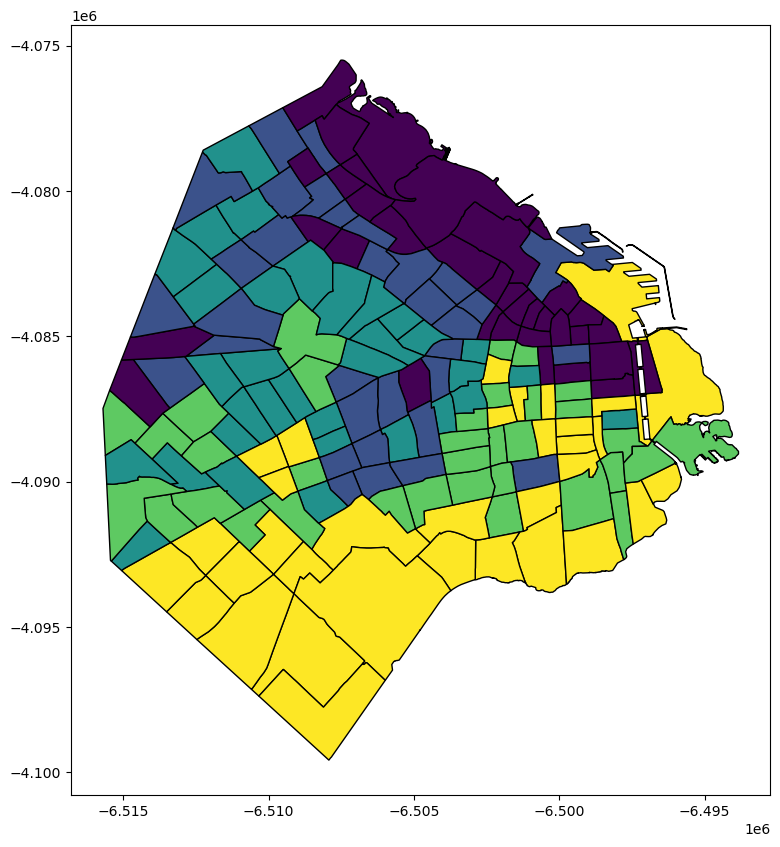

In [18]:
CO = rosetta[["RADIO","H_COMPUTADORA"]]
COM = pd.merge(CO,tabla_intermedia,on="RADIO",how="inner")
COME = pd.merge(tabla_intermedia,COM,on="RADIO",how="inner")
COME.rename(columns={"circuito_x":"circuito"},inplace=True)
COME = COME[["circuito","H_COMPUTADORA"]]
COMPUTADORA_agrupado = COME.groupby(['circuito']).mean()
COMPUTADORA_agrupado.reset_index(inplace=True)
COMPUTADORA_agrupado = COMPUTADORA_agrupado.rename(columns = {'index':'circuito'})
COMPMERG = pd.merge(circuitos_geometria,COMPUTADORA_agrupado,on="circuito",how="inner")
COMPMERG.plot(column='H_COMPUTADORA', scheme='quantiles', figsize=(10, 10),edgecolor="k")

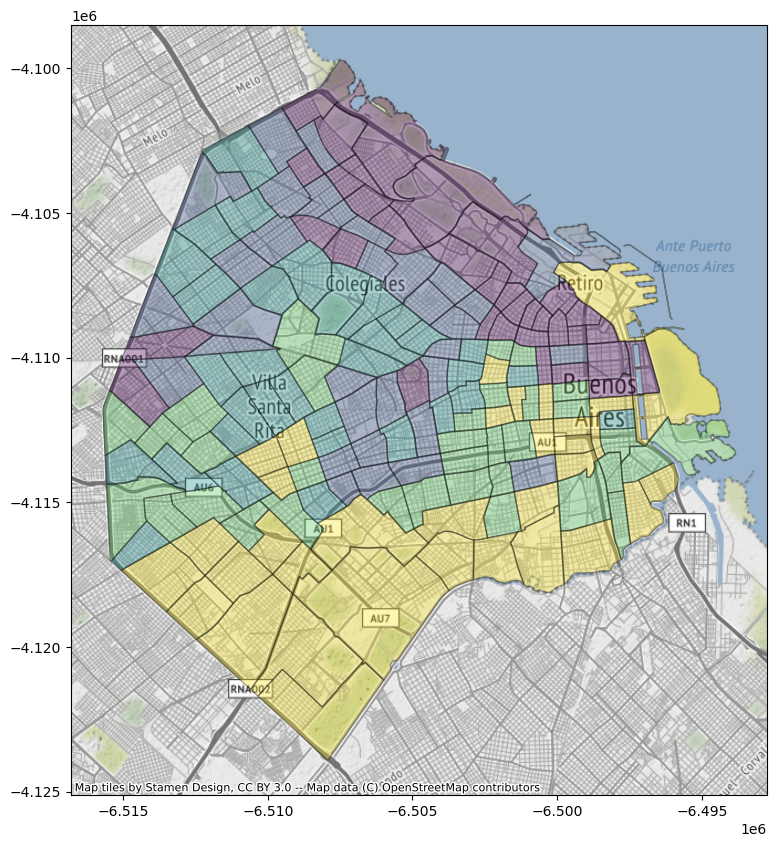

In [19]:
COMPMERG2 = COMPMERG.to_crs(epsg=3857)
ax = COMPMERG2.plot(column='H_COMPUTADORA',scheme='quantiles',figsize=(10, 10), alpha=0.35, edgecolor='k')
ctx.add_basemap(ax)

##### Computadora/ Posee

,circuito,geometry,H_COMPUTADORA
0,0003,"POLYGON Z ((-6496304.252 -4084732.697 0.000, -...",2089
1,0045,"POLYGON Z ((-6501230.474 -4091702.182 0.000, -...",4832
2,0037,"POLYGON Z ((-6501166.688 -4087904.826 0.000, -...",8088
3,0018,"POLYGON Z ((-6498832.986 -4088373.028 0.000, -...",5131
4,0141,"POLYGON Z ((-6503862.400 -4078547.361 0.000, -...",12032
...,...,...,...
162,0135,"POLYGON Z ((-6507834.614 -4077215.626 0.000, -...",10014
163,0149,"POLYGON Z ((-6503253.371 -4080723.227 0.000, -...",23441
164,0101,"POLYGON Z ((-6515182.479 -4090061.116 0.000, -...",12983
165,0102,"POLYGON Z ((-6514598.831 -4088679.114 0.000, -...",10920


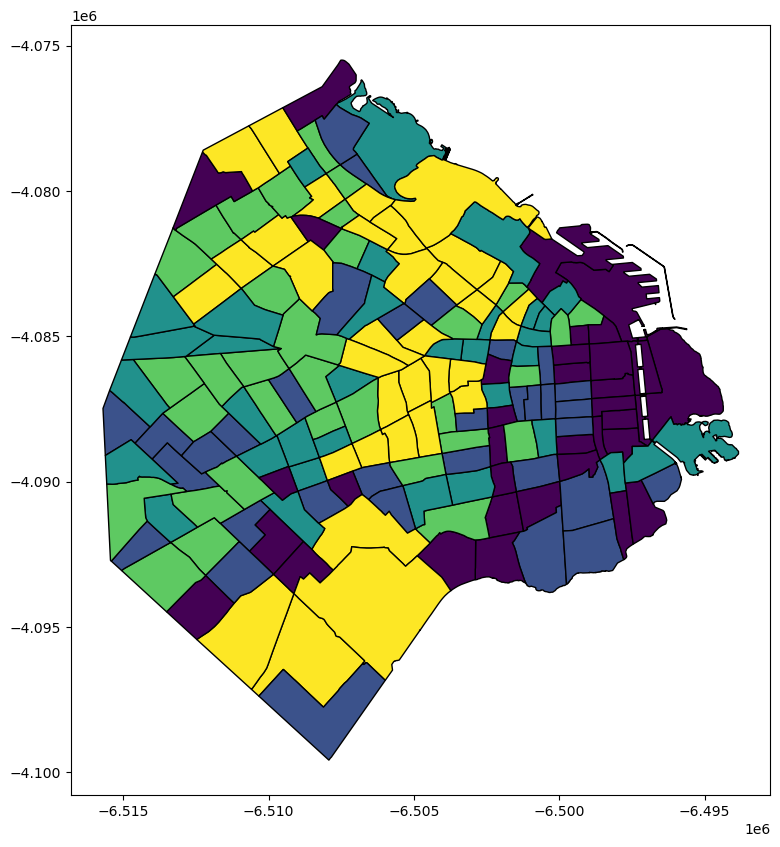

In [20]:
CO = rosetta[["RADIO","H_COMPUTADORA"]]
COM = pd.merge(CO,tabla_intermedia,on="RADIO",how="inner")
COME = pd.merge(tabla_intermedia,COM,on="RADIO",how="inner")
COME.rename(columns={"circuito_x":"circuito"},inplace=True)
COME = COME[["circuito","H_COMPUTADORA"]]
COME_1 = COME[COME["H_COMPUTADORA"]==1]
COME_1 = (COME_1[["circuito", "H_COMPUTADORA"]]
.groupby(["circuito"])
.count()
)
COME_1.reset_index(inplace=True)
COME_1 = COME_1.rename(columns = {'index':'circuito'})
COME_1 = pd.merge(circuitos_geometria,COME_1,on="circuito",how="inner")
COME_1.plot(column="H_COMPUTADORA", scheme='quantiles', figsize=(10, 10),edgecolor="k")
COME_1

##### Computadora/ No Posee

<AxesSubplot:>

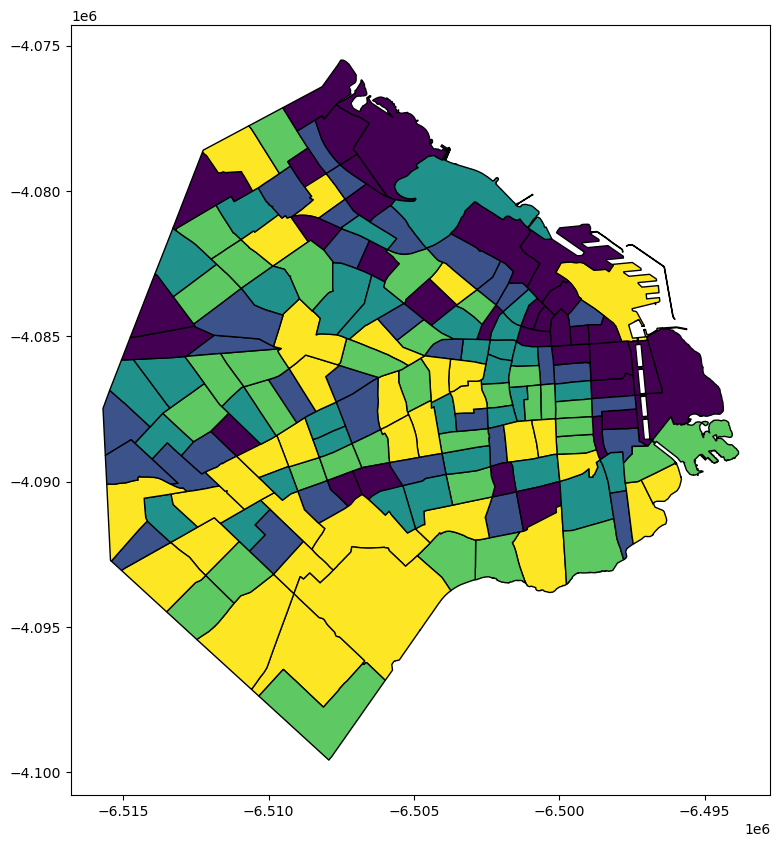

In [21]:
COME_2 = COME[COME["H_COMPUTADORA"]==2]
COME_2 = (COME_2[["circuito", "H_COMPUTADORA"]]
.groupby(["circuito"])
.count()
)
COME_2.reset_index(inplace=True)
COME_2 = COME_2.rename(columns = {'index':'circuito'})
COME_2 = pd.merge(circuitos_geometria,COME_2,on="circuito",how="inner")
COME_2.plot(column="H_COMPUTADORA", scheme='quantiles', figsize=(10, 10),edgecolor="k")

### PROPIETARIOS

##### Total Propietarios/ Promedio

In [22]:
PROP = rosetta[["RADIO","PROP"]]
pd.unique(PROP["PROP"])

array([5, 1, 6, 3, 0, 2, 4], dtype=int64)

<AxesSubplot:>

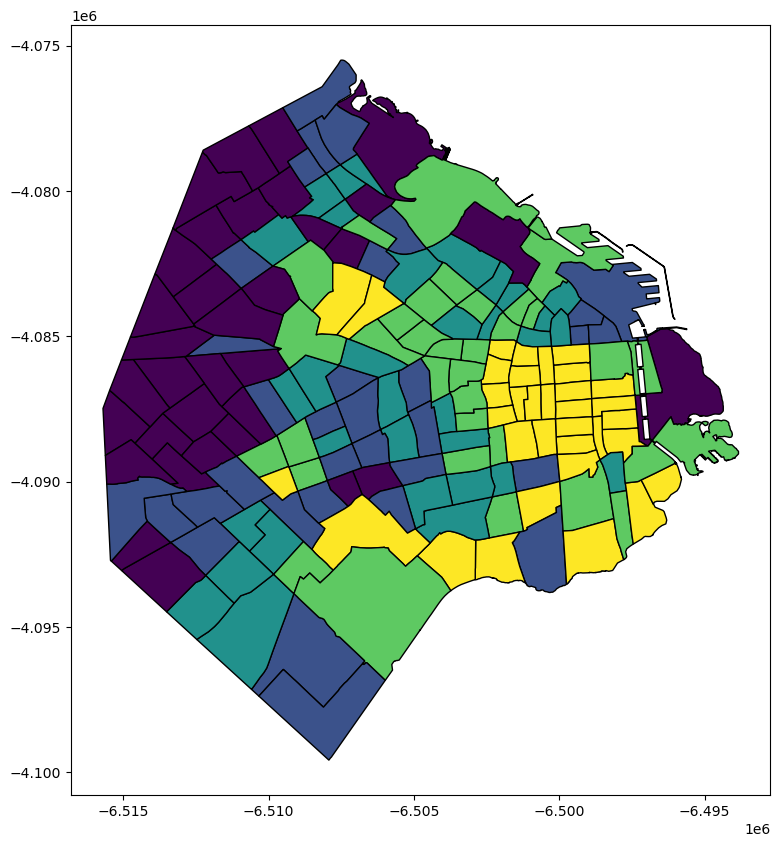

In [23]:
PROP = rosetta[["RADIO","PROP"]]
PROPM = pd.merge(PROP,tabla_intermedia,on="RADIO",how="inner")
PROPME = pd.merge(tabla_intermedia,PROPM,on="RADIO",how="inner")
PROPME.rename(columns={"circuito_x":"circuito"},inplace=True)
PROPME = PROPME[["circuito","PROP"]]
PROP_agrupado = PROPME.groupby(['circuito']).mean()
PROP_agrupado.reset_index(inplace=True)
PROP_agrupado = PROP_agrupado.rename(columns = {'index':'circuito'})
PMERG = pd.merge(circuitos_geometria,PROP_agrupado,on="circuito",how="inner")
PMERG.plot(column='PROP', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Propietarios/ Vivienda y-o Terreno

<AxesSubplot:>

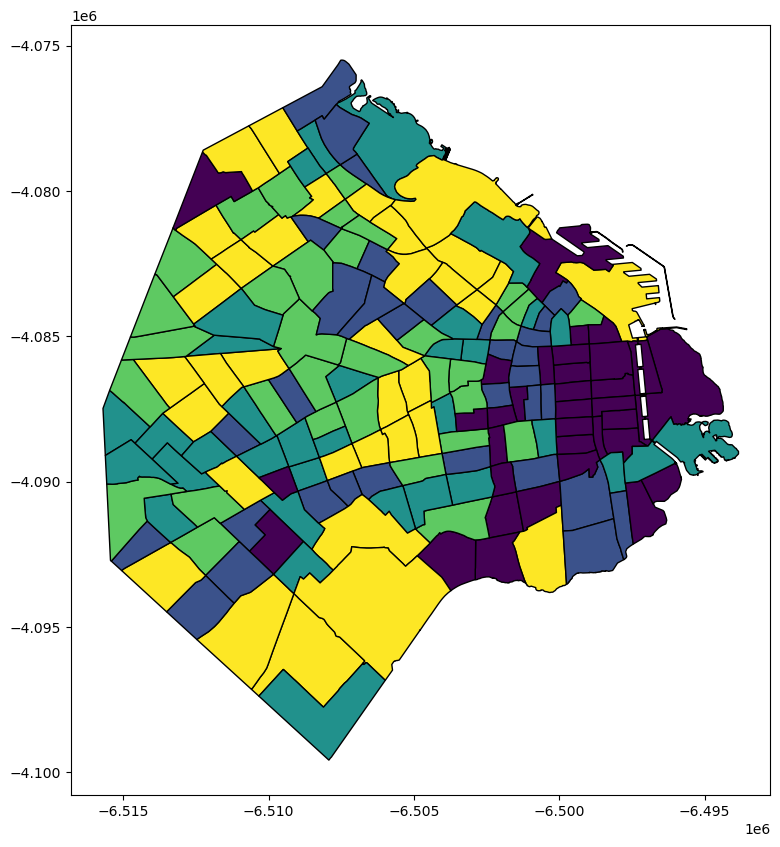

In [24]:
PROP_1 = PROPME.loc[PROPME["PROP"].isin([1,2])]
PROP_1 = (PROP_1[["circuito", "PROP"]]
.groupby(["circuito"])
.count()
)
PROP_1.reset_index(inplace=True)
PROP_1 = PROP_1.rename(columns = {'index':'circuito'})
PROP_1 = pd.merge(circuitos_geometria,PROP_1,on="circuito",how="inner")
PROP_1.plot(column="PROP", scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Propietarios/ Inquilinos-Préstamo-Por Trabajo-Otra Situación

<AxesSubplot:>

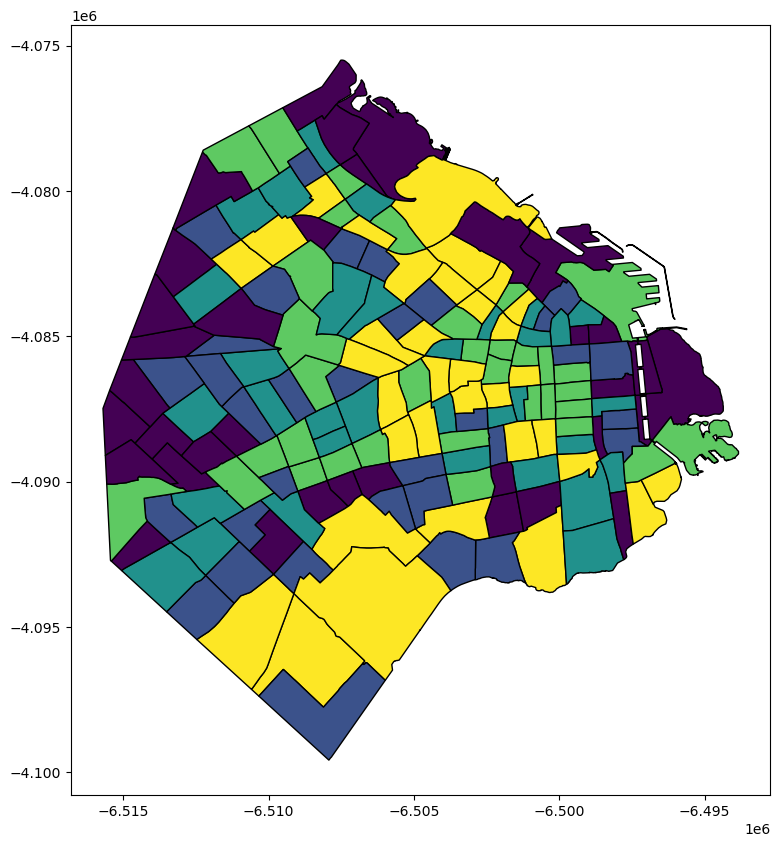

In [25]:
PROP_3 = PROPME.loc[PROPME["PROP"].isin([3, 4, 5, 6])]
PROP_3 = (PROP_3[["circuito", "PROP"]]
.groupby(["circuito"])
.count()
)
PROP_3.reset_index(inplace=True)
PROP_3 = PROP_3.rename(columns = {'index':'circuito'})
PROP_3 = pd.merge(circuitos_geometria,PROP_3,on="circuito",how="inner")
PROP_3.plot(column="PROP", scheme='quantiles', figsize=(10, 10),edgecolor="k")

### NIVEL EDUCATIVO

##### Total Nivel Educativo/Promedio

<AxesSubplot:>

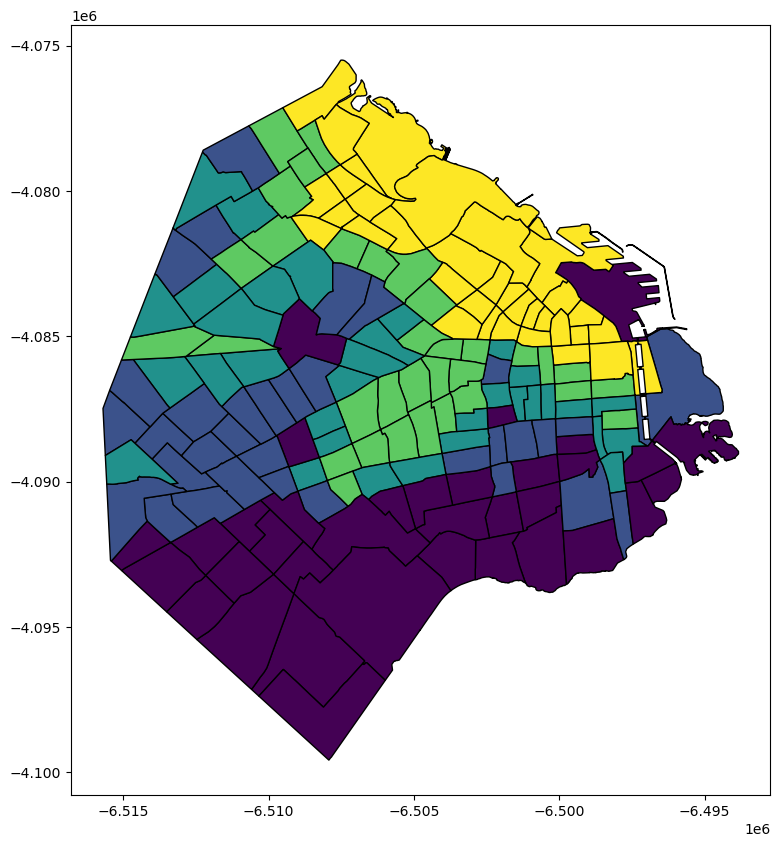

In [26]:
NIVELE = rosetta[["RADIO","P_NIVELED"]]
NIVELEM = pd.merge(NIVELE,tabla_intermedia,on="RADIO",how="inner")
NIVELEME = pd.merge(tabla_intermedia,NIVELEM,on="RADIO",how="inner")
NIVELEME.rename(columns={"circuito_x":"circuito"},inplace=True)
NIVELEME = NIVELEME[["circuito","P_NIVELED"]]
ED_agrupado = NIVELEME.groupby(['circuito']).mean()
ED_agrupado.reset_index(inplace=True)
ED_agrupado = ED_agrupado.rename(columns = {'index':'circuito'})
EDMERG = pd.merge(circuitos_geometria,ED_agrupado,on="circuito",how="inner")
EDMERG.plot(column='P_NIVELED', scheme='quantiles', figsize=(10, 10),edgecolor="k")

In [27]:
NIVELE = rosetta[["RADIO","P_NIVELED"]]
pd.unique(NIVELE["P_NIVELED"])


array([4, 7, 6, 2, 5, 0, 1, 8, 3, 9], dtype=int64)

##### Nivel Educativo/ Primario

<AxesSubplot:>

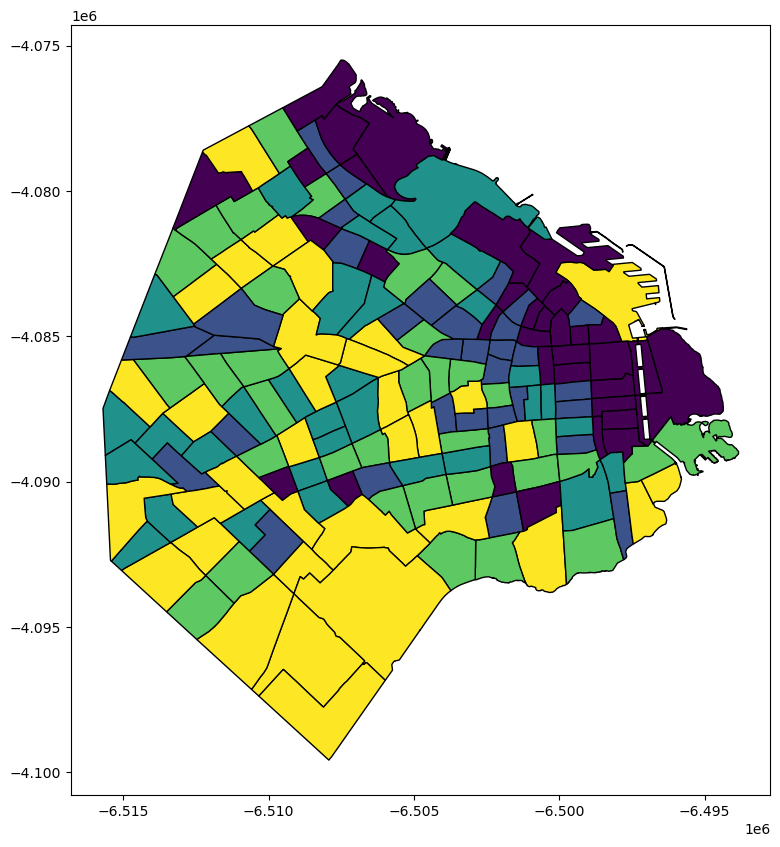

In [28]:
NIVELE = rosetta[["RADIO","P_NIVELED"]]
NIVELEME = pd.merge(NIVELE,tabla_intermedia,on="RADIO",how="inner")
NIVELEME = NIVELEME[["circuito","P_NIVELED"]]
ED_2 = NIVELEME[NIVELEME["P_NIVELED"]==2]
ED_2 = (ED_2[["circuito", "P_NIVELED"]]
.groupby(["circuito"])
.count()
)
ED_2.reset_index(inplace=True)
ED_2 = ED_2.rename(columns = {'index':'circuito'})
EDM_2 = pd.merge(circuitos_geometria,ED_2,on="circuito",how="inner")
EDM_2.plot(column="P_NIVELED", scheme='quantiles', figsize=(10, 10),edgecolor="k")


##### Nivel Educativo/ Bachiller-Secundario-Polimodal

<AxesSubplot:>

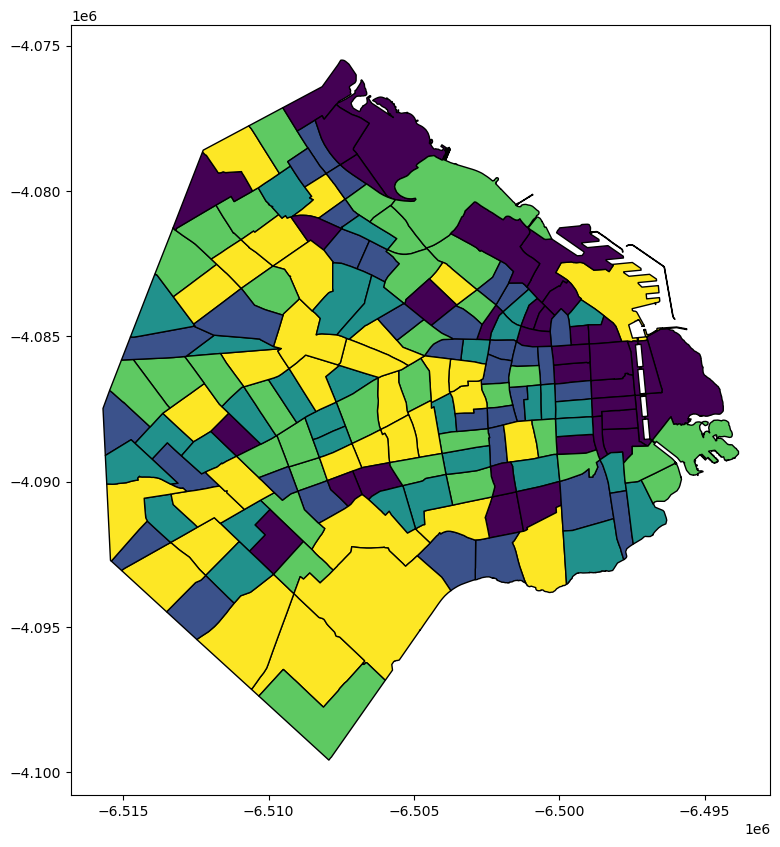

In [29]:
NIVELE = rosetta[["RADIO","P_NIVELED"]]
NIVELEME = pd.merge(NIVELE,tabla_intermedia,on="RADIO",how="inner")
NIVELEME = NIVELEME[["circuito","P_NIVELED"]]
ED_3 = NIVELEME.loc[NIVELEME["P_NIVELED"].isin([3,4,5])]
ED_3 = (ED_3[["circuito", "P_NIVELED"]]
.groupby(["circuito"])
.count()
)
ED_3.reset_index(inplace=True)
ED_3 = ED_3.rename(columns = {'index':'circuito'})
EDM_3 = pd.merge(circuitos_geometria,ED_3,on="circuito",how="inner")
EDM_3.plot(column="P_NIVELED", scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Nivel Educativo/ Universitario-PostUniversitario

<AxesSubplot:>

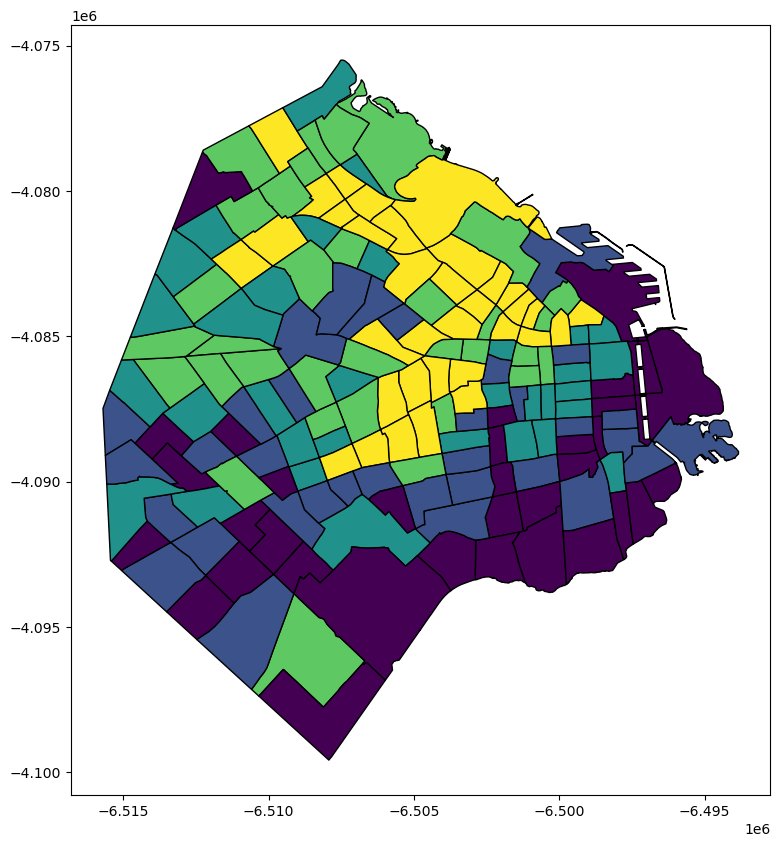

In [30]:
NIVELE = rosetta[["RADIO","P_NIVELED"]]
NIVELEME = pd.merge(NIVELE,tabla_intermedia,on="RADIO",how="inner")
NIVELEME = NIVELEME[["circuito","P_NIVELED"]]
ED_7 = NIVELEME.loc[NIVELEME["P_NIVELED"].isin([7,8])]
ED_7 = (ED_7[["circuito", "P_NIVELED"]]
.groupby(["circuito"])
.count()
)
ED_7.reset_index(inplace=True)
ED_7 = ED_7.rename(columns = {'index':'circuito'})
EDM_7 = pd.merge(circuitos_geometria,ED_7,on="circuito",how="inner")
EDM_7.plot(column="P_NIVELED", scheme='quantiles', figsize=(10, 10),edgecolor="k")

### SEXO

##### Total Sexo/Promedio

In [31]:
SEXO = rosetta[["RADIO","SEXO"]]
pd.unique(SEXO['SEXO'])

array([2, 1], dtype=int64)

<AxesSubplot:>

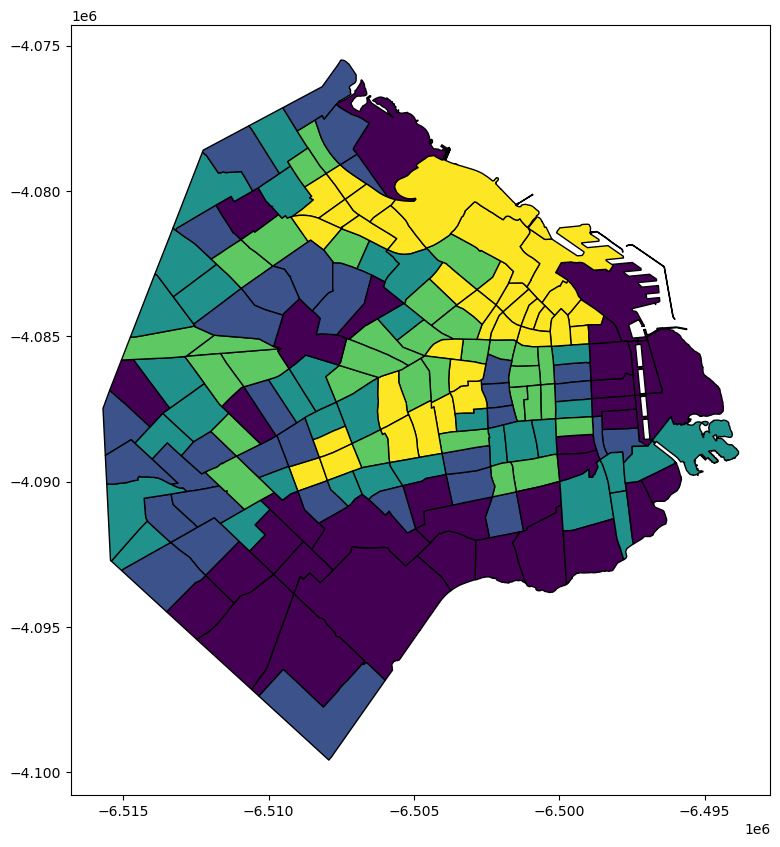

In [32]:
SEXO = rosetta[["RADIO","SEXO"]]
SEXOM = pd.merge(SEXO,tabla_intermedia,on="RADIO",how="inner")
SEXOME = pd.merge(tabla_intermedia,SEXOM,on="RADIO",how="inner")
SEXOME.rename(columns={"circuito_x":"circuito"},inplace=True)
SEXOME = SEXOME[["circuito","SEXO"]]
SEX_agrupado = SEXOME.groupby(['circuito']).mean()
SEX_agrupado.reset_index(inplace=True)
SEX_agrupado = SEX_agrupado.rename(columns = {'index':'circuito'})
SEXMERG = pd.merge(circuitos_geometria,SEX_agrupado,on="circuito",how="inner")
SEXMERG.plot(column='SEXO', scheme='quantiles', figsize=(10, 10),edgecolor="k")

In [33]:
#SEXOMERG = pd.merge(voto_circuito,SEXOME,on="circuito",how="inner")
#SEXOMERG

##### Sexo/ Masculino

<AxesSubplot:>

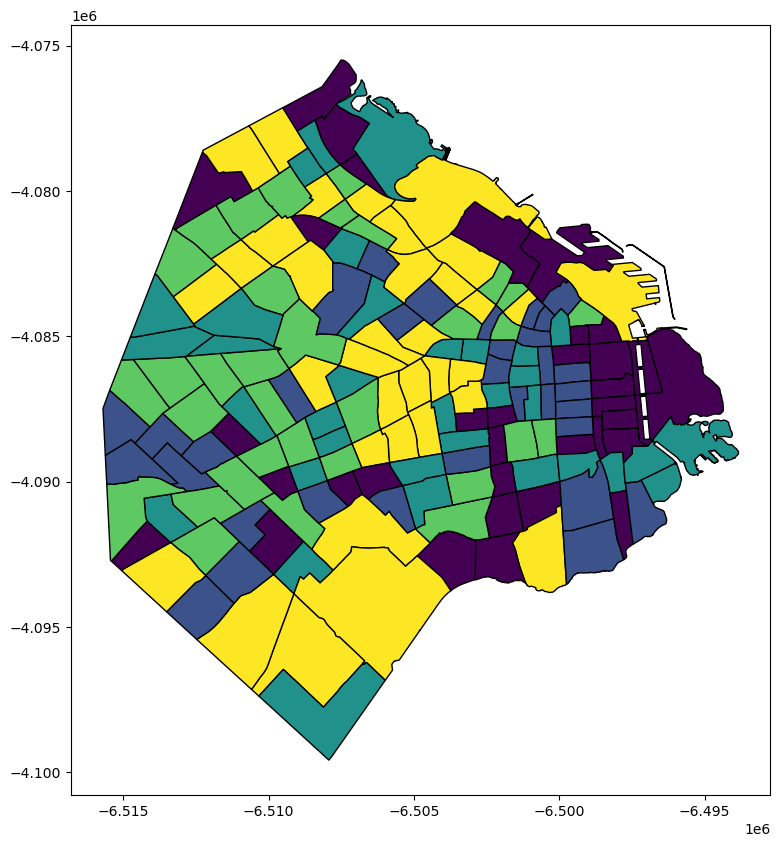

In [34]:
SEXO_HOMBRES = SEXOME[SEXOME["SEXO"]==1]
SEX_HOM = (SEXO_HOMBRES[['circuito', 'SEXO']]
.groupby(['circuito'])
.count()
)
SEX_HOM.reset_index(inplace=True)
SEX_HOM = SEX_HOM.rename(columns = {'index':'circuito'})
SEX_HOM = pd.merge(circuitos_geometria,SEX_HOM,on="circuito",how="inner")
SEX_HOM.plot(column='SEXO', scheme='quantiles', figsize=(10, 10),edgecolor="k")


##### Sexo/ Femenino

<AxesSubplot:>

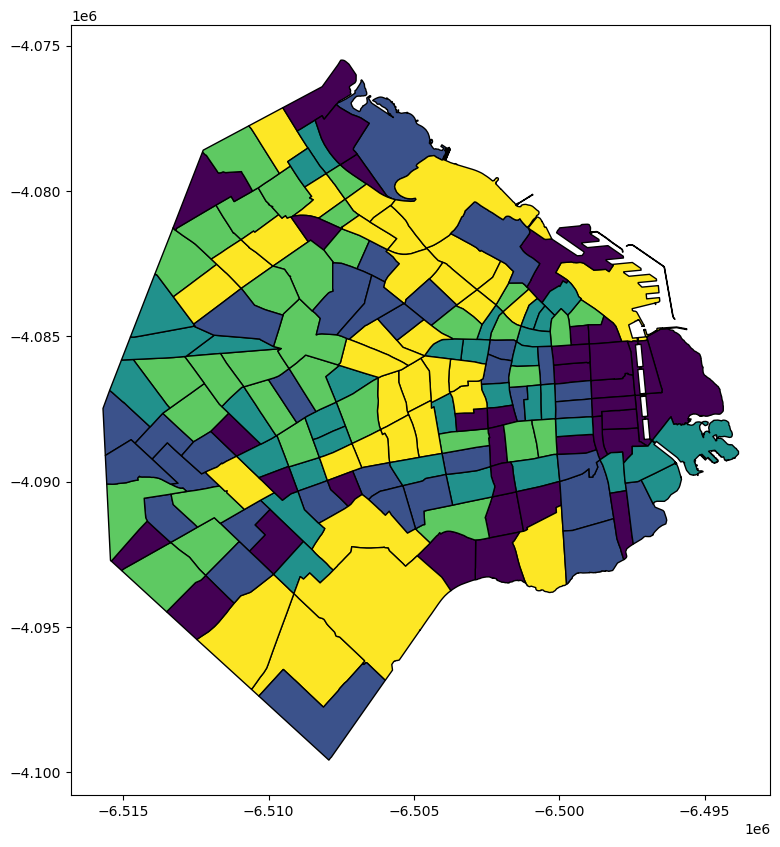

In [35]:
SEXO_FEMENINO = SEXOME[SEXOME["SEXO"]==2]
SEX_FEM = (SEXO_FEMENINO[['circuito', 'SEXO']]
.groupby(['circuito'])
.count()
)
SEX_FEM.reset_index(inplace=True)
SEX_FEM = SEX_FEM.rename(columns = {'index':'circuito'})
SEX_FEM = pd.merge(circuitos_geometria,SEX_FEM,on="circuito",how="inner")
SEX_FEM.plot(column='SEXO', scheme='quantiles', figsize=(10, 10),edgecolor="k")

### EDAD

#### Edad Agrupada 

##### Edad Agrupada entre 15 Y 64 años

In [36]:
EDADAGRU = rosetta[["RADIO","EDADAGRU"]]
pd.unique(EDADAGRU["EDADAGRU"])

array([2, 3, 1], dtype=int64)

In [37]:
EDADAGRU = rosetta[["RADIO","EDADAGRU"]]
pd.unique(EDADAGRU["EDADAGRU"])
EDAGRU = pd.merge(EDADAGRU,tabla_intermedia,on="RADIO",how="inner")
EDAG = EDAGRU[["circuito","EDADAGRU"]]

EDADMER = pd.merge(EDAG,voto_circuito,on="circuito",how="inner")
EDADMER = EDADMER[EDADMER["EDADAGRU"]==2]
EDADMER = EDADMER.drop(["suma_votos","nv","pp1","pp2","pp3","pp4"], axis=1)

edad_circuito = (EDADMER[['circuito', 'EDADAGRU']]
.groupby(['circuito'])
.count()
)

edad_circuito

,EDADAGRU
circuito,
0001,7026
0002,7102
0003,2517
0004,1182
0005,19904
...,...
0163,9679
0164,9287
0165,14687


<AxesSubplot:>

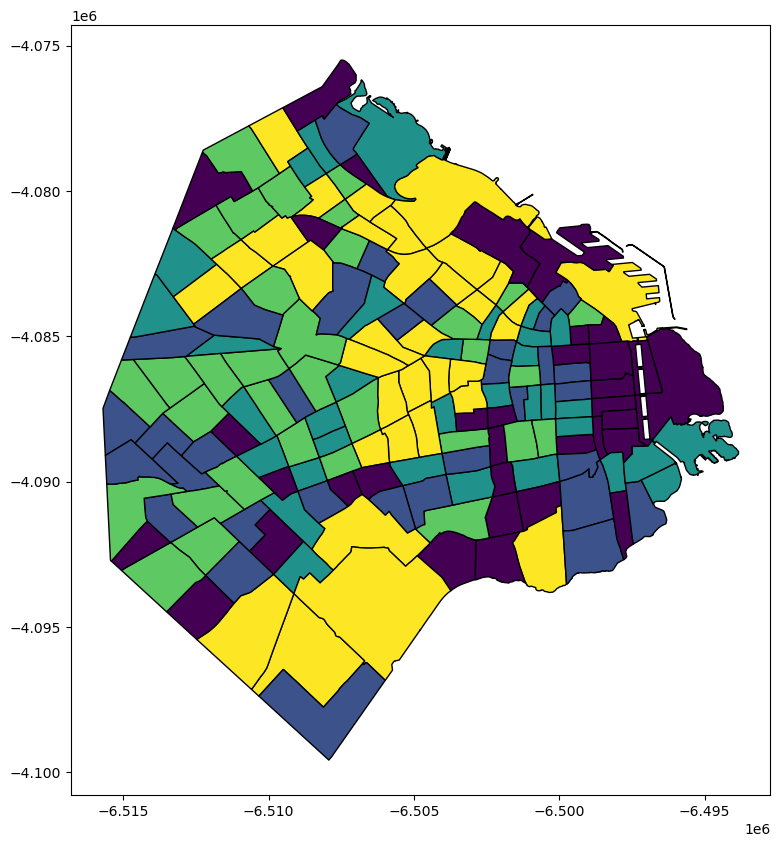

In [38]:
#ploteo edad 
edad_circuito.reset_index(inplace=True)
edad_circuito = edad_circuito.rename(columns = {'index':'circuito'})
edad_merge = pd.merge(circuitos_geometria,edad_circuito,on="circuito",how="inner")
edad_merge.plot(column='EDADAGRU', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Edad Agrupada +65

<AxesSubplot:>

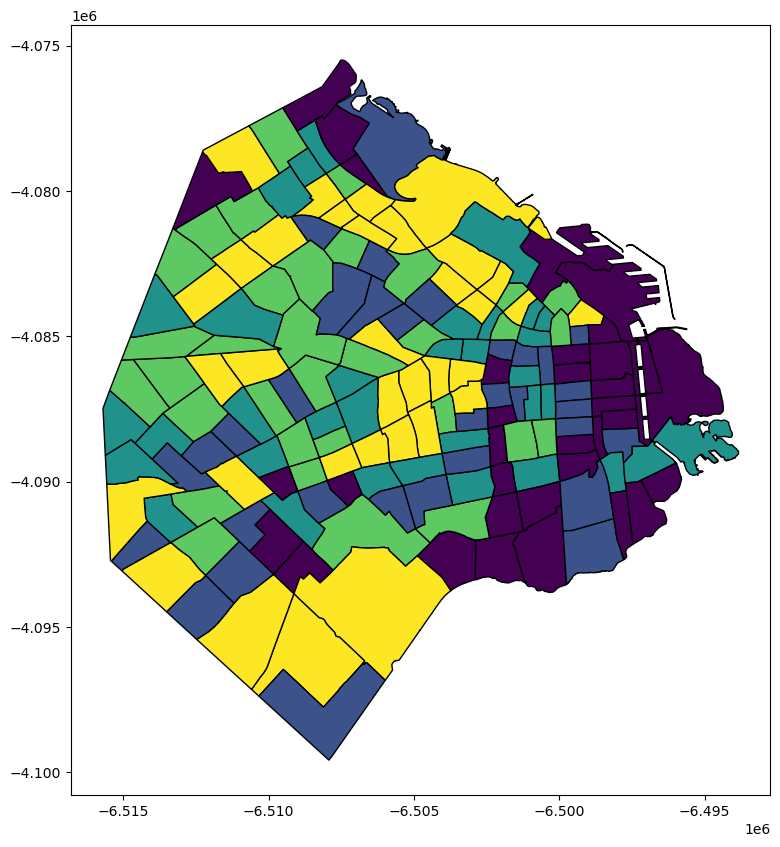

In [39]:
EDADAGRU = rosetta[["RADIO","EDADAGRU"]]
pd.unique(EDADAGRU["EDADAGRU"])
EDAG = pd.merge(EDADAGRU,tabla_intermedia,on="RADIO",how="inner")
EDAG = EDAG[["circuito","EDADAGRU"]]
EDAG = EDAG[EDAG["EDADAGRU"]==3]
edad3_circuito = (EDAG[['circuito', 'EDADAGRU']]
.groupby(['circuito'])
.count()
)
#edad3_circuito.reset_index(inplace=True)
#edad3_circuito = edad3_circuito.rename(columns = {'index':'circuito'})
edad3_merge = pd.merge(circuitos_geometria,edad3_circuito,on="circuito",how="inner")
edad3_merge.plot(column='EDADAGRU', scheme='quantiles', figsize=(10, 10),edgecolor="k")

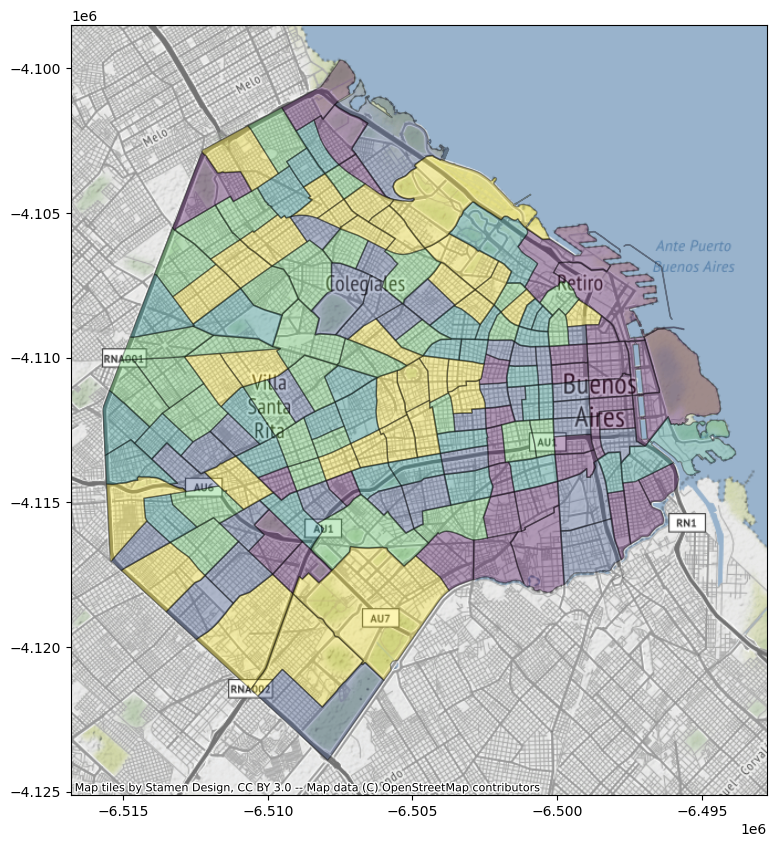

In [40]:
edad3_crs= edad3_merge.to_crs(epsg=3857)
ax = edad3_crs.plot(column='EDADAGRU',scheme='quantiles',figsize=(10, 10), alpha=0.35, edgecolor='k')
ctx.add_basemap(ax)

#### Edad Intervalar entre 16 Y 25

<AxesSubplot:>

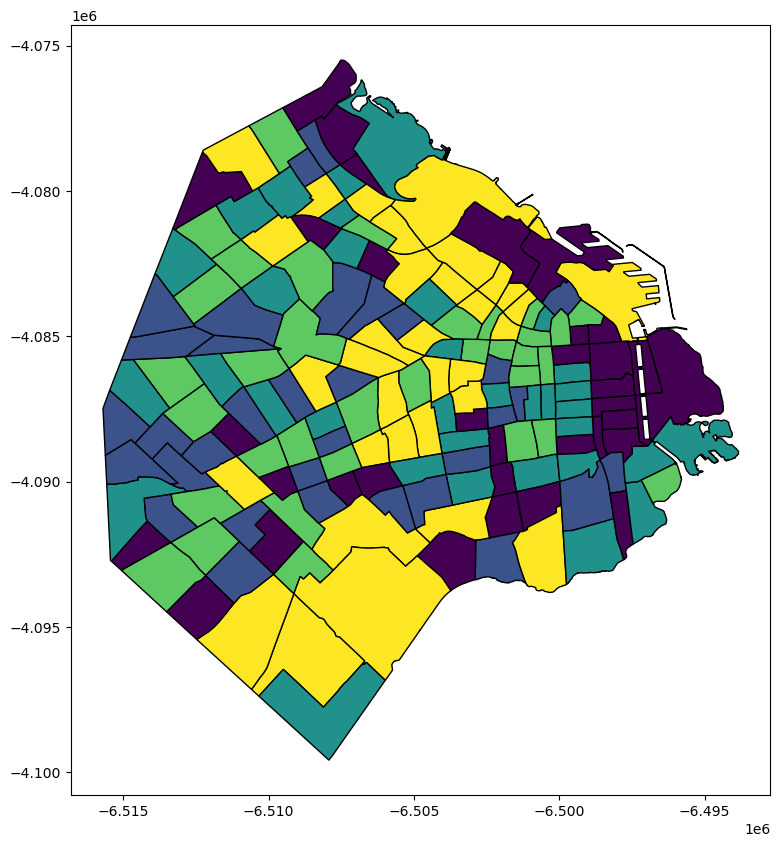

In [41]:
EDADIN = rosetta[["RADIO","EDAD"]]
EDIN = pd.merge(tabla_intermedia,EDADIN, on="RADIO",how="inner")
EDIN = EDIN[["circuito","EDAD"]]
EDIN = EDIN.loc[EDIN["EDAD"].isin([16,17,18,19,20,21,22,23,24,25])]
edin_circuito = (EDIN[['circuito', 'EDAD']]
.groupby(['circuito'])
.count()
)
#edin_circuito.reset_index(inplace=True)
#edin_circuito = edin_circuito.rename(columns = {'index':'circuito'})
edin_merge = pd.merge(circuitos_geometria,edin_circuito,on="circuito",how="inner")
edin_merge.plot(column='EDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")


#### Edad Intervalar entre 26 Y 35

<AxesSubplot:>

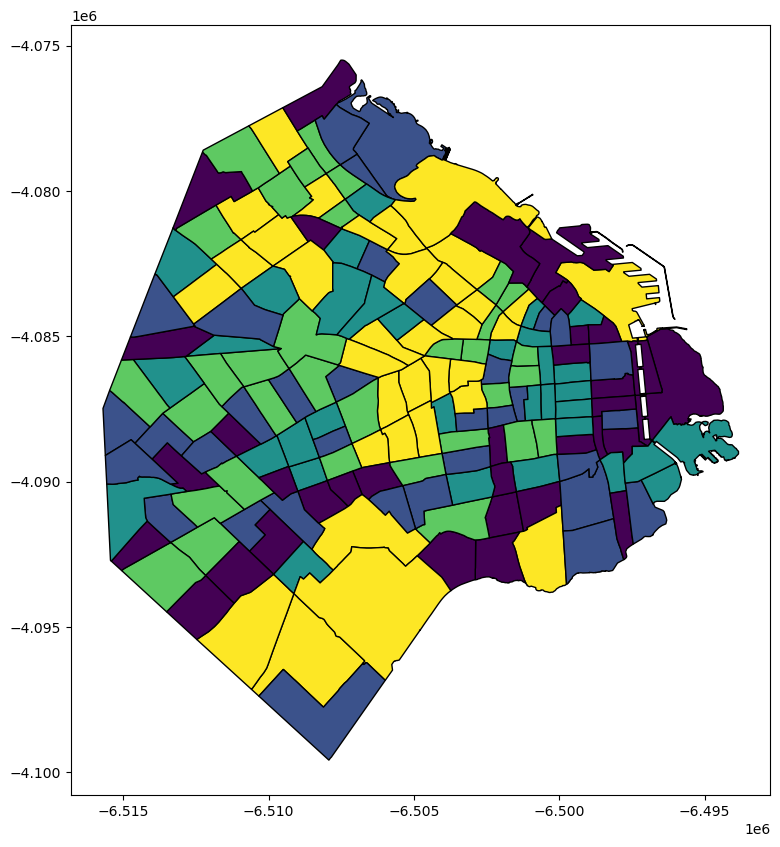

In [42]:
EDADIN = rosetta[["RADIO","EDAD"]]
EDIN = pd.merge(tabla_intermedia,EDADIN,on="RADIO",how="inner")
EDIN = EDIN[["circuito","EDAD"]]
EDIN26 = EDIN.loc[EDIN["EDAD"].isin([26,27,28,29,30,31,32,33,34,35])]
edin26_circuito = (EDIN26[['circuito', 'EDAD']]
.groupby(['circuito'])
.count()
)
#edin26_circuito.reset_index(inplace=True)
#edin26_circuito = edin26_circuito.rename(columns = {'index':'circuito'})
edin26_merge = pd.merge(circuitos_geometria,edin26_circuito,on="circuito",how="inner")
edin26_merge.plot(column='EDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")

#### Edad Intervalar entre 36 Y 50

<AxesSubplot:>

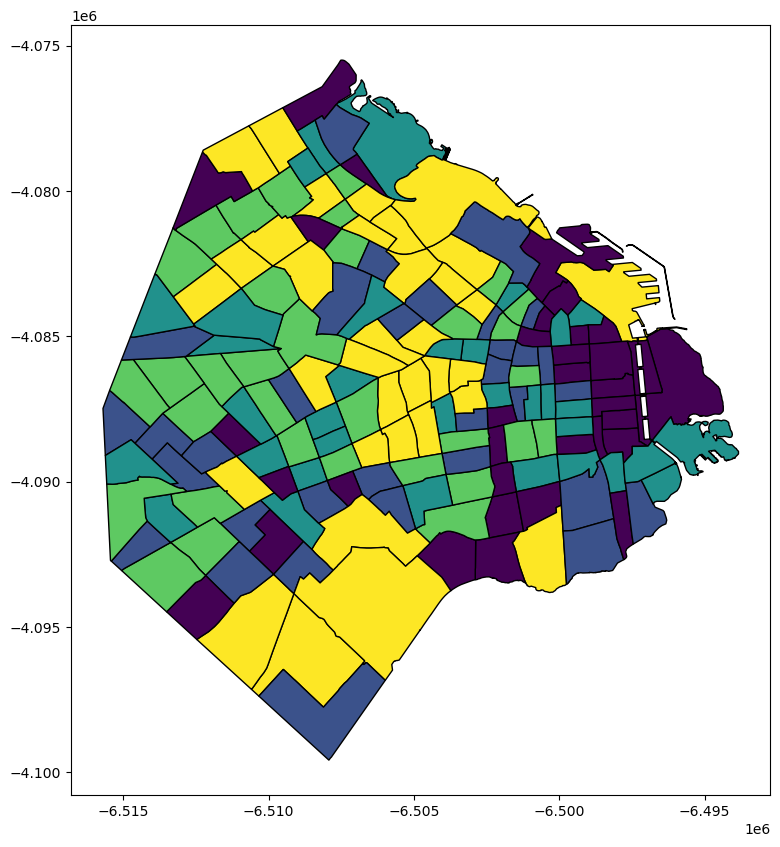

In [43]:
EDADIN = rosetta[["RADIO","EDAD"]]
EDIN = pd.merge(tabla_intermedia,EDADIN,on="RADIO",how="inner")
EDIN.rename(columns={"circuito_x":"circuito"},inplace=True)
EDIN = EDIN[["circuito","EDAD"]]
EDIN36 = EDIN.loc[EDIN["EDAD"].isin([36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50])]
edin36_circuito = (EDIN36[['circuito', 'EDAD']]
.groupby(['circuito'])
.count()
)
edin36_circuito.reset_index(inplace=True)
edin36_circuito = edin36_circuito.rename(columns = {'index':'circuito'})
edin36_merge = pd.merge(circuitos_geometria,edin36_circuito,on="circuito",how="inner")
edin36_merge.plot(column='EDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")


#### Edad Intervalar entre 51 Y 70

<AxesSubplot:>

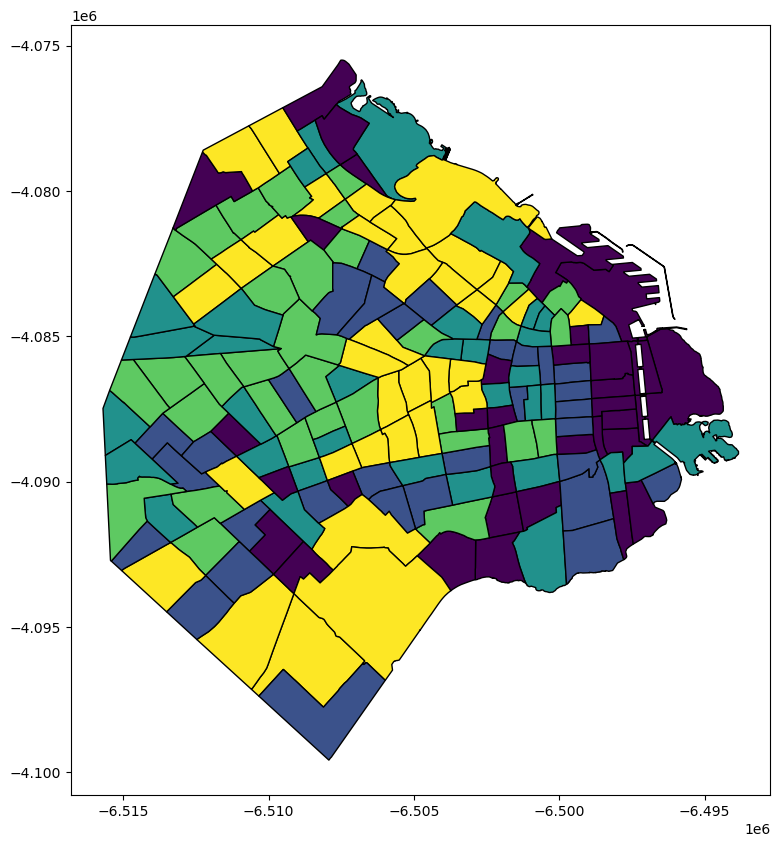

In [44]:
EDADIN = rosetta[["RADIO","EDAD"]]
EDIN = pd.merge(tabla_intermedia,EDADIN,on="RADIO",how="inner")
EDIN.rename(columns={"circuito_x":"circuito"},inplace=True)
EDIN = EDIN[["circuito","EDAD"]]
EDIN51 = EDIN.loc[EDIN["EDAD"].isin([51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70])]
edin51_circuito = (EDIN51[['circuito', 'EDAD']]
.groupby(['circuito'])
.count()
)
edin51_circuito.reset_index(inplace=True)
edin51_circuito = edin51_circuito.rename(columns = {'index':'circuito'})
edin51_merge = pd.merge(circuitos_geometria,edin51_circuito,on="circuito",how="inner")
edin51_merge.plot(column='EDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")


#### Edad Intervalar menores de 16 años

<AxesSubplot:>

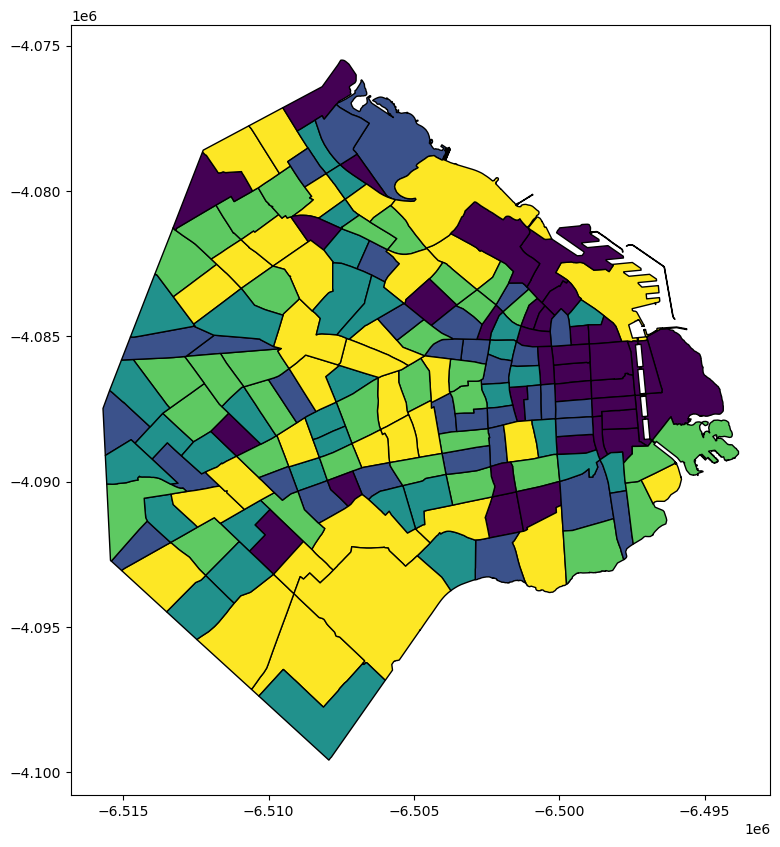

In [45]:
EDADIN = rosetta[["RADIO","EDAD"]]
EDIN = pd.merge(EDADIN,tabla_intermedia,on="RADIO",how="inner")
EDIN.rename(columns={"circuito_x":"circuito"},inplace=True)
EDIN = EDIN[["circuito","EDAD"]]
EDIN0 = EDIN.loc[EDIN["EDAD"].isin([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15])]
edin0_circuito = (EDIN0[['circuito', 'EDAD']]
.groupby(['circuito'])
.count()
)
edin0_circuito.reset_index(inplace=True)
edin0_circuito = edin0_circuito.rename(columns = {'index':'circuito'})
edin0_merge = pd.merge(circuitos_geometria,edin0_circuito,on="circuito",how="inner")
edin0_merge.plot(column='EDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")


### CONDICIÓN DE ACTIVIDAD

##### Total Condición de Actividad/ Promedio

In [46]:
CONDA = rosetta[["RADIO","CONDACT"]]
pd.unique(CONDA["CONDACT"])

array([1, 3, 2, 0], dtype=int64)

<AxesSubplot:>

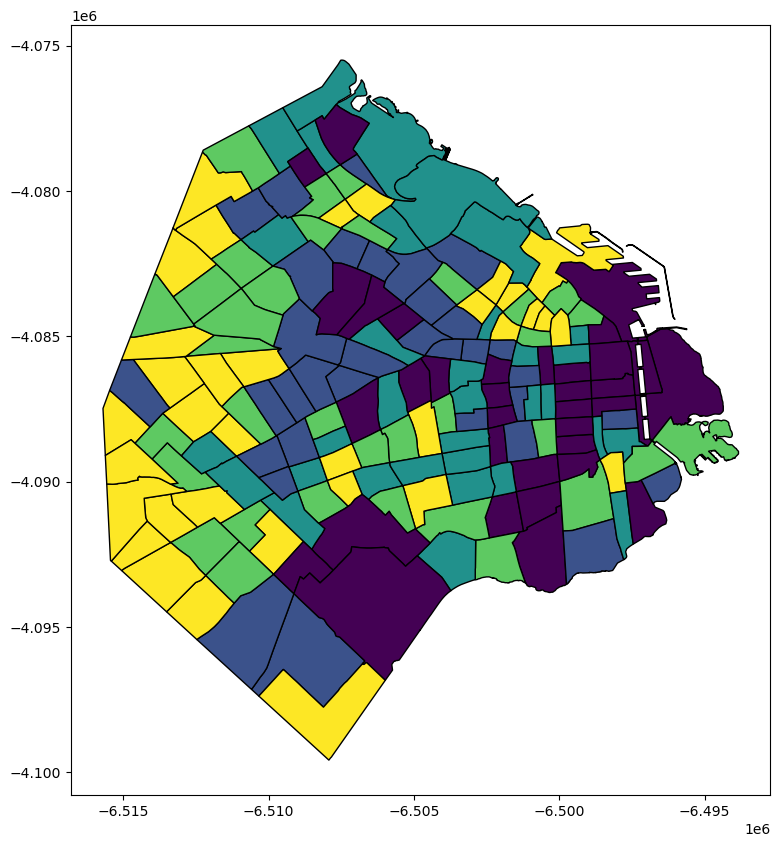

In [47]:
CONDA = rosetta[["RADIO","CONDACT"]]
CONDACT = pd.merge(CONDA,tabla_intermedia,on="RADIO",how="inner")
CONDACT = CONDACT[["circuito","CONDACT"]]
CONDACT_agrupado = CONDACT.groupby(['circuito']).mean()
CONDACT_agrupado.reset_index(inplace=True)
CONDACT_agrupado = CONDACT_agrupado.rename(columns = {'index':'circuito'})
CONDACTMERG = pd.merge(circuitos_geometria,CONDACT_agrupado,on="circuito",how="inner")
CONDACTMERG.plot(column='CONDACT', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Condición de Actividad/ Menor de 14

<AxesSubplot:>

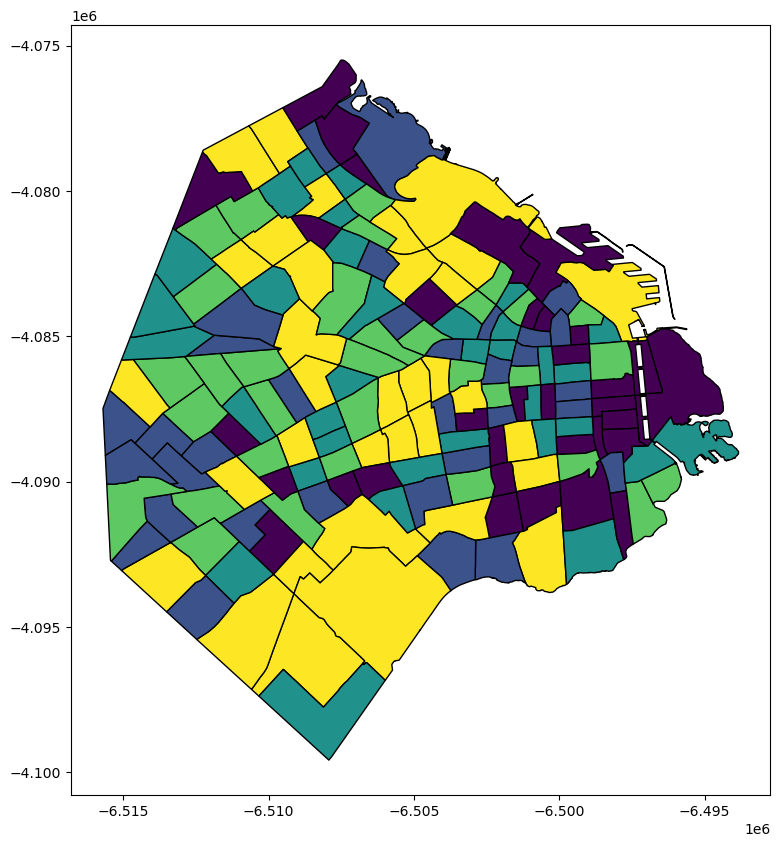

In [48]:
CONDA = rosetta[["RADIO","CONDACT"]]
CONDACT = pd.merge(CONDA,tabla_intermedia,on="RADIO",how="inner")
CONDACT = CONDACT[["circuito","CONDACT"]]
CONDACT0 = CONDACT[CONDACT["CONDACT"]==0]
condact0_circuito = (CONDACT0[['circuito', 'CONDACT']]
.groupby(['circuito'])
.count()
)
condact0_circuito.reset_index(inplace=True)
condact0_circuito = condact0_circuito.rename(columns = {'index':'circuito'})
condact0_merge = pd.merge(circuitos_geometria,condact0_circuito,on="circuito",how="inner")
condact0_merge.plot(column='CONDACT', scheme='quantiles', figsize=(10, 10),edgecolor="k")


##### Condición de Actividad/ Ocupada

<AxesSubplot:>

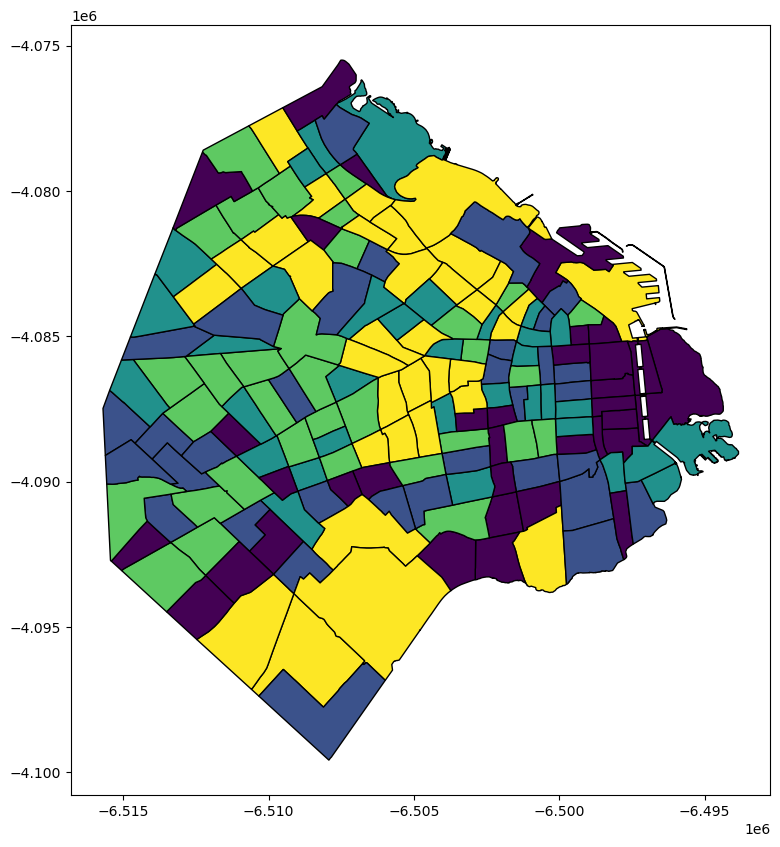

In [49]:
CONDA = rosetta[["RADIO","CONDACT"]]
CONDACT = pd.merge(CONDA,tabla_intermedia,on="RADIO",how="inner")
CONDACT = CONDACT[["circuito","CONDACT"]]
CONDACT1 = CONDACT[CONDACT["CONDACT"]==1]
condact1_circuito = (CONDACT1[['circuito', 'CONDACT']]
.groupby(['circuito'])
.count()
)
condact1_circuito.reset_index(inplace=True)
condact1_circuito = condact1_circuito.rename(columns = {'index':'circuito'})
condact1_merge = pd.merge(circuitos_geometria,condact1_circuito,on="circuito",how="inner")
condact1_merge.plot(column='CONDACT', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Condición de Actividad/ Desocupada

<AxesSubplot:>

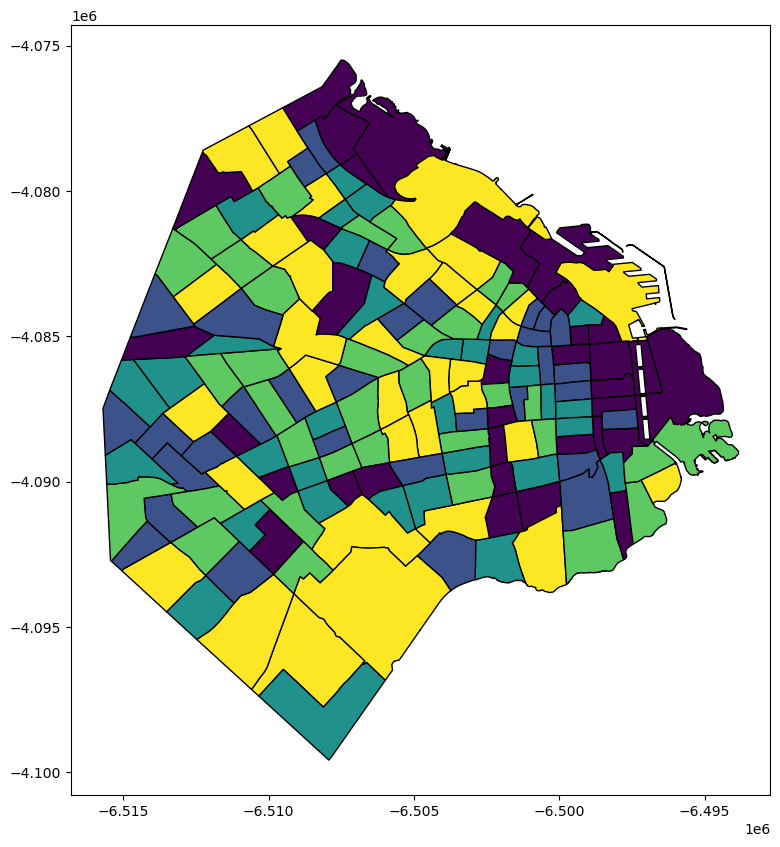

In [50]:
CONDACT2 = CONDACT[CONDACT["CONDACT"]==2]
condact2_circuito = (CONDACT2[['circuito', 'CONDACT']]
.groupby(['circuito'])
.count()
)
condact2_circuito.reset_index(inplace=True)
condact2_circuito = condact2_circuito.rename(columns = {'index':'circuito'})
condact2_merge = pd.merge(circuitos_geometria,condact2_circuito,on="circuito",how="inner")
condact2_merge.plot(column='CONDACT', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Condición de Actividad/ Económicamente Inactivo

<AxesSubplot:>

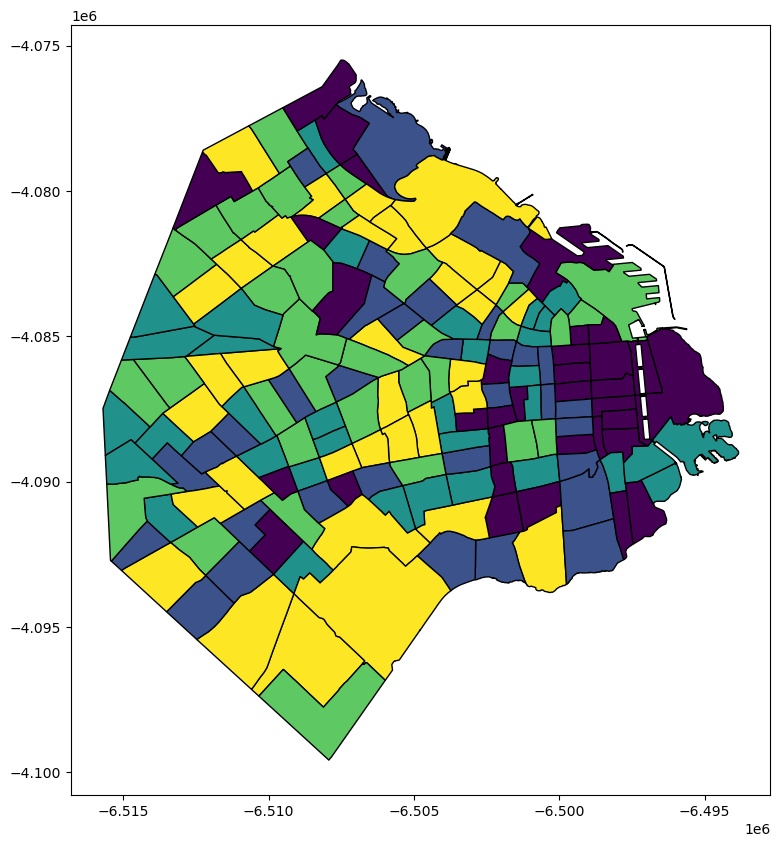

In [51]:
CONDACT3 = CONDACT[CONDACT["CONDACT"]==3]
condact3_circuito = (CONDACT3[['circuito', 'CONDACT']]
.groupby(['circuito'])
.count()
)
condact3_circuito.reset_index(inplace=True)
condact3_circuito = condact3_circuito.rename(columns = {'index':'circuito'})
condact3_merge = pd.merge(circuitos_geometria,condact3_circuito,on="circuito",how="inner")
condact3_merge.plot(column='CONDACT', scheme='quantiles', figsize=(10, 10),edgecolor="k")

### NBI

##### Total NBI/ Porcentaje

In [52]:
ANBI = rosetta[["RADIO","ALGUNBI"]]
pd.unique(ANBI["ALGUNBI"])

array([0, 1, 2], dtype=int64)

<AxesSubplot:>

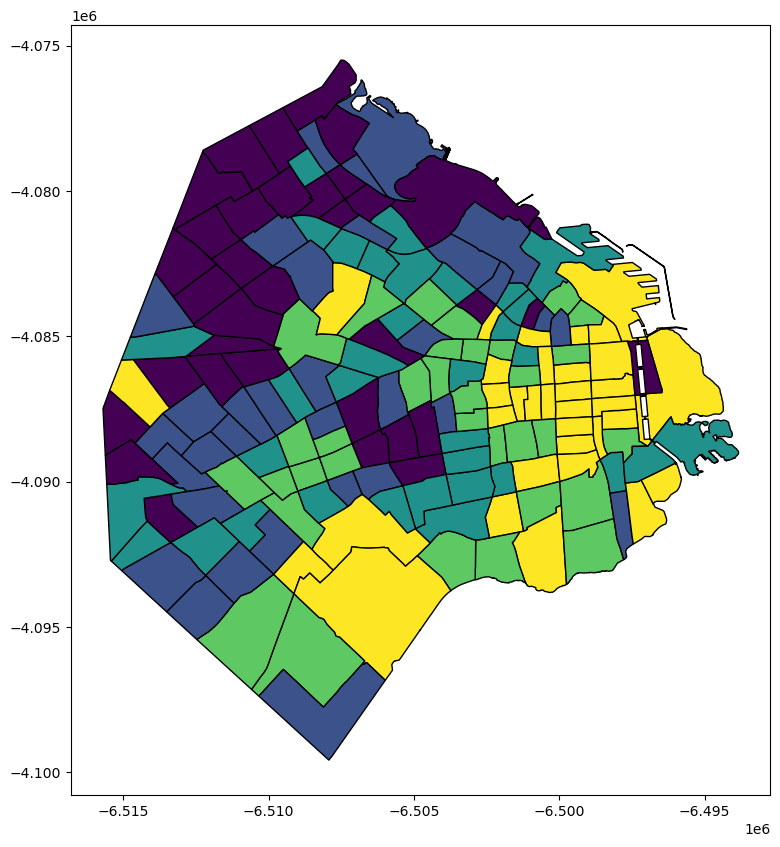

In [53]:
ANBI = rosetta[["RADIO","ALGUNBI"]]
NBI = pd.merge(ANBI,tabla_intermedia,on="RADIO",how="inner")
NBI = NBI[["circuito","ALGUNBI"]]
NBI_agrupado = NBI.groupby(['circuito']).mean()
NBI_agrupado.reset_index(inplace=True)
NBI_agrupado = NBI_agrupado.rename(columns = {'index':'circuito'})
NBIMERG = pd.merge(circuitos_geometria,NBI_agrupado,on="circuito",how="inner")
NBIMERG.plot(column='ALGUNBI', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### NBI/ No

<AxesSubplot:>

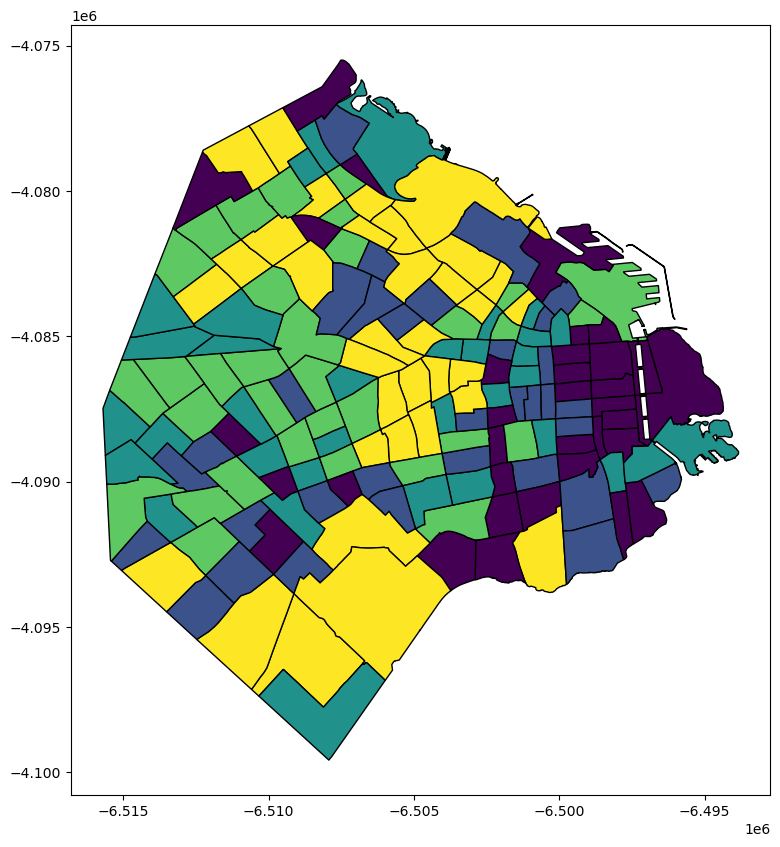

In [54]:
NBI_0 = NBI[NBI["ALGUNBI"]==0]
NBI_0 = (NBI_0[['circuito', 'ALGUNBI']]
.groupby(['circuito'])
.count()
)
NBI_0.reset_index(inplace=True)
NBI_0 = NBI_0.rename(columns = {'index':'circuito'})
NBI_0_merge = pd.merge(circuitos_geometria,NBI_0,on="circuito",how="inner")
NBI_0_merge.plot(column='ALGUNBI', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### NBI/ Sí

<AxesSubplot:>

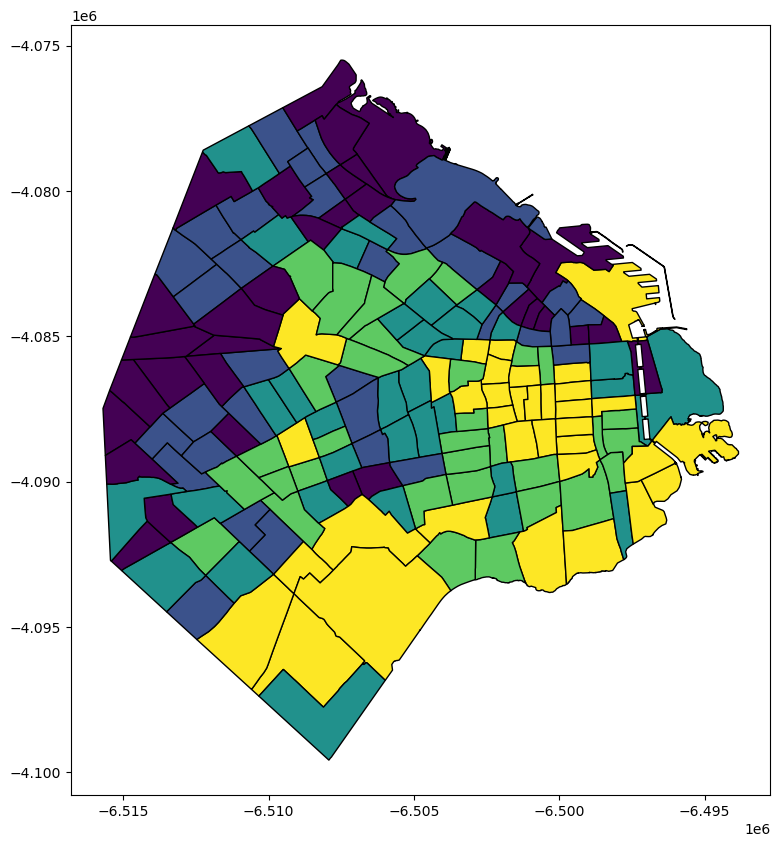

In [55]:
NBI_1 = NBI[NBI["ALGUNBI"]==1]
NBI_1 = (NBI_1[['circuito', 'ALGUNBI']]
.groupby(['circuito'])
.count()
)
NBI_1.reset_index(inplace=True)
NBI_1 = NBI_1.rename(columns = {'index':'circuito'})
NBI_1_merge = pd.merge(circuitos_geometria,NBI_1,on="circuito",how="inner")
NBI_1_merge.plot(column='ALGUNBI', scheme='quantiles', figsize=(10, 10),edgecolor="k")

### CELULAR

##### Total Celular/ Promedio

In [56]:
CELU = rosetta[["RADIO","CELULAR"]]
pd.unique(CELU["CELULAR"])

array([1, 2, 0], dtype=int64)

<AxesSubplot:>

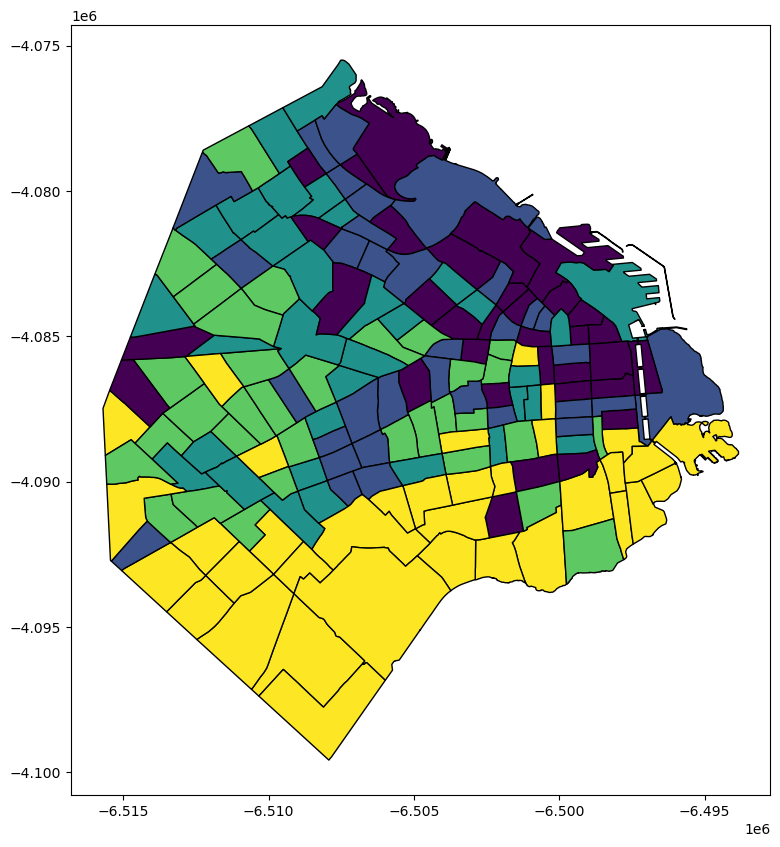

In [57]:
CELU = rosetta[["RADIO","CELULAR"]]
CELULAR = pd.merge(CELU,tabla_intermedia,on="RADIO",how="inner")
CELULAR = CELULAR[["circuito","CELULAR"]]
CELULAR_agrupado = CELULAR.groupby(['circuito']).mean()
CELULAR_agrupado.reset_index(inplace=True)
CELULAR_agrupado = CELULAR_agrupado.rename(columns = {'index':'circuito'})
CELULARMERG = pd.merge(circuitos_geometria,CELULAR_agrupado,on="circuito",how="inner")
CELULARMERG.plot(column='CELULAR', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Celular/ Sí

<AxesSubplot:>

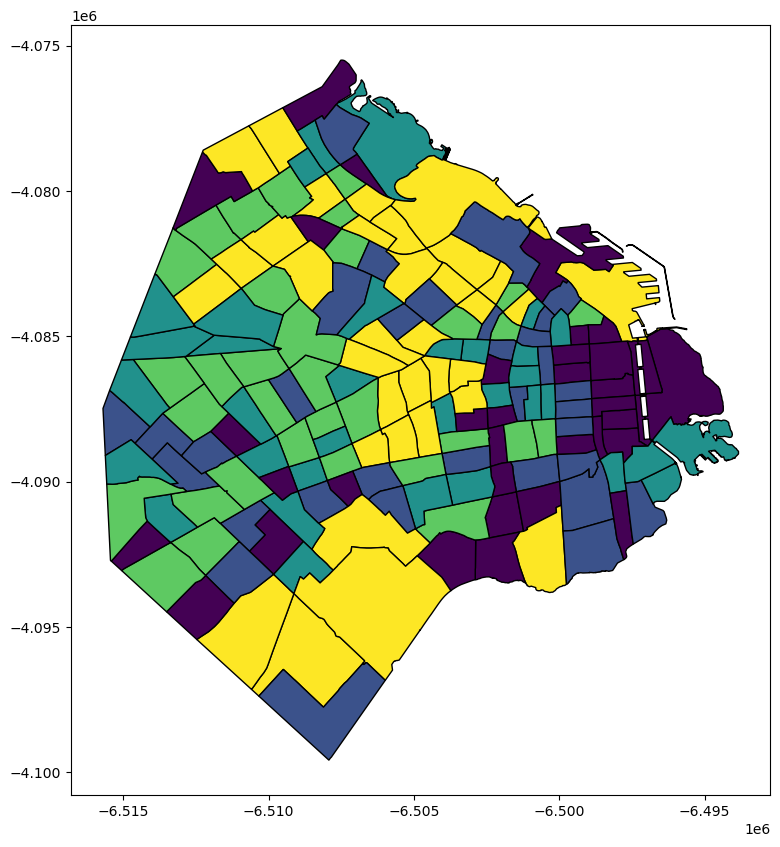

In [58]:
CELULAR_1 = CELULAR[CELULAR["CELULAR"]==1]
CELULAR_1 = (CELULAR_1[['circuito', 'CELULAR']]
.groupby(['circuito'])
.count()
)
CELULAR_1.reset_index(inplace=True)
CELULAR_1 = CELULAR_1.rename(columns = {'index':'circuito'})
CELULAR_1_merge = pd.merge(circuitos_geometria,CELULAR_1,on="circuito",how="inner")
CELULAR_1_merge.plot(column='CELULAR', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Celular/ No

<AxesSubplot:>

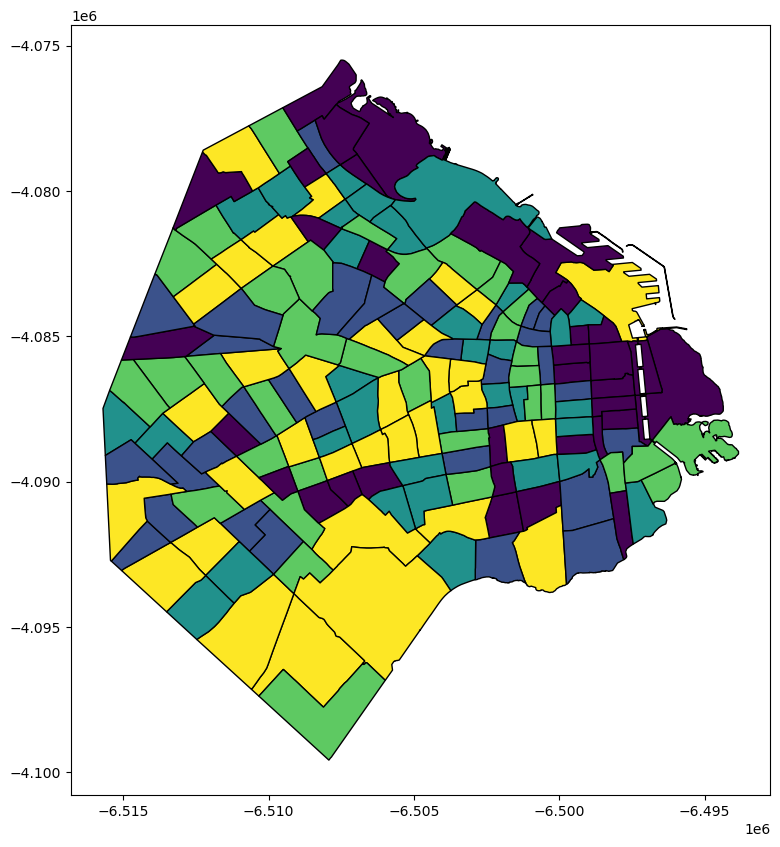

In [59]:
CELULAR_2 = CELULAR[CELULAR["CELULAR"]==2]
CELULAR_2 = (CELULAR_2[['circuito', 'CELULAR']]
.groupby(['circuito'])
.count()
)
CELULAR_2.reset_index(inplace=True)
CELULAR_2 = CELULAR_2.rename(columns = {'index':'circuito'})
CELULAR_2_merge = pd.merge(circuitos_geometria,CELULAR_2,on="circuito",how="inner")
CELULAR_2_merge.plot(column='CELULAR', scheme='quantiles', figsize=(10, 10),edgecolor="k")

### NACIONALIDAD

##### Total Nacionalidad/ Promedio

In [60]:
NAC = rosetta[["RADIO","P_NACDAD"]]
pd.unique(NAC["P_NACDAD"])

array([1, 2], dtype=int64)

<AxesSubplot:>

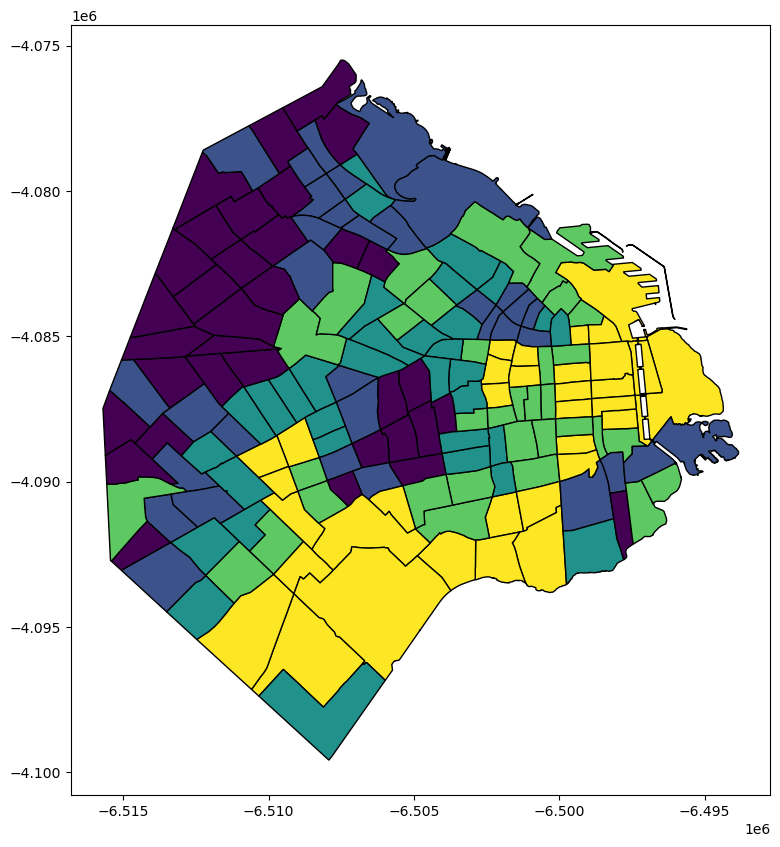

In [61]:
NAC = rosetta[["RADIO","P_NACDAD"]]
NACIONALIDAD = pd.merge(NAC,tabla_intermedia,on="RADIO",how="inner")
NACIONALIDAD = NACIONALIDAD[["circuito","P_NACDAD"]]
NACIONALIDAD_agrupado = NACIONALIDAD.groupby(['circuito']).mean()
NACIONALIDAD_agrupado.reset_index(inplace=True)
NACIONALIDAD_agrupado = NACIONALIDAD_agrupado.rename(columns = {'index':'circuito'})
NACIONALIDADMERG = pd.merge(circuitos_geometria,NACIONALIDAD_agrupado,on="circuito",how="inner")
NACIONALIDADMERG.plot(column='P_NACDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Nacionalidad/ Argentina

<AxesSubplot:>

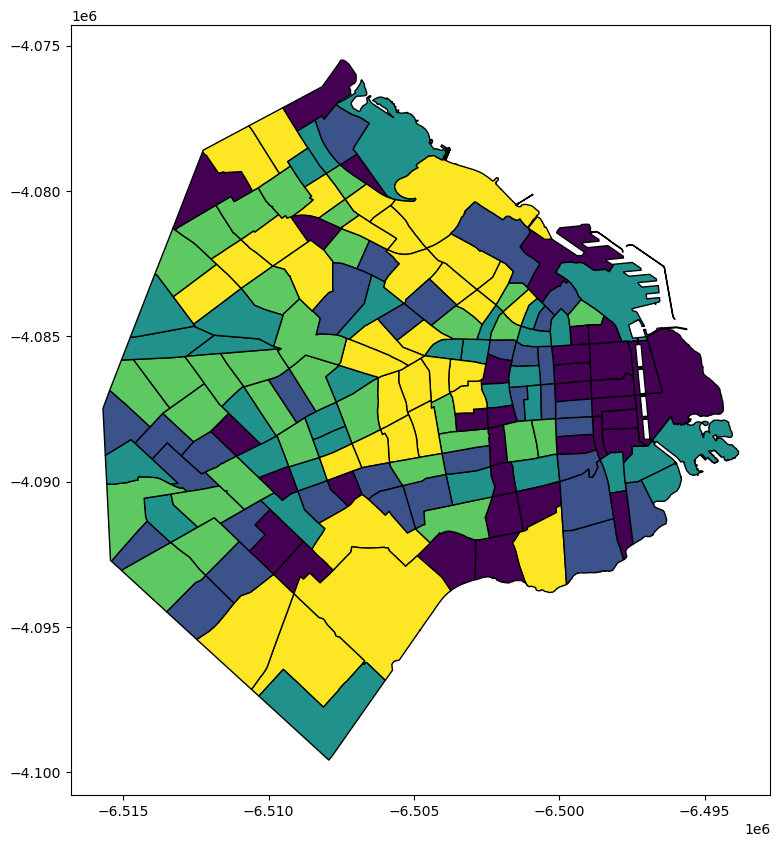

In [62]:
NACIONALIDAD_1 = NACIONALIDAD[NACIONALIDAD["P_NACDAD"]==1]
NACIONALIDAD_1 = (NACIONALIDAD_1[['circuito', 'P_NACDAD']]
.groupby(['circuito'])
.count()
)
NACIONALIDAD_1.reset_index(inplace=True)
NACIONALIDAD_1 = NACIONALIDAD_1.rename(columns = {'index':'circuito'})
NACIONALIDAD_1_merge = pd.merge(circuitos_geometria,NACIONALIDAD_1,on="circuito",how="inner")
NACIONALIDAD_1_merge.plot(column='P_NACDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Nacionalidad/ Extranjera

<AxesSubplot:>

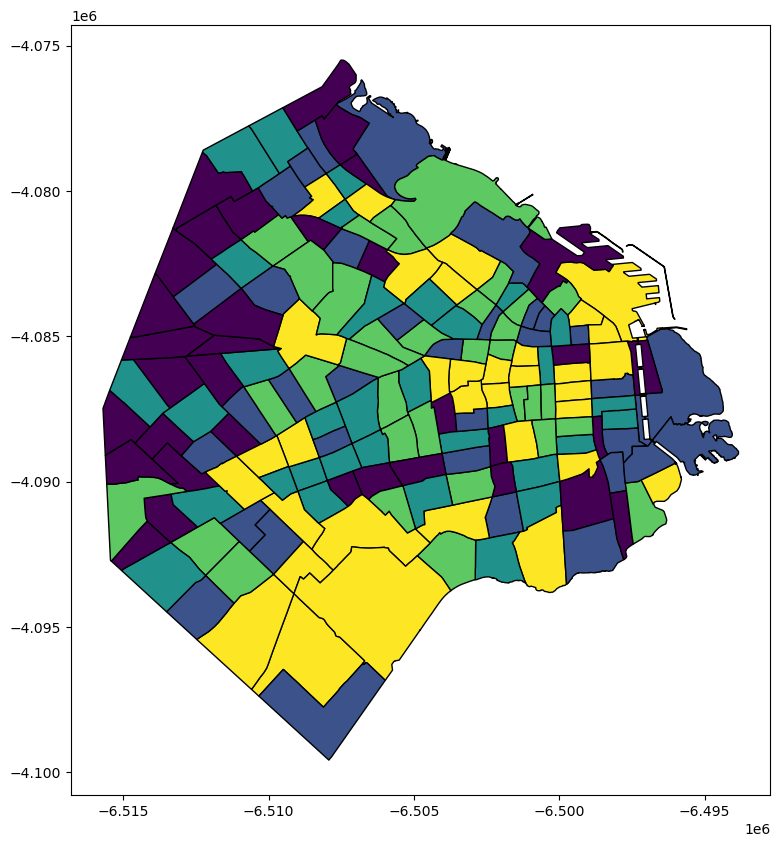

In [63]:
NACIONALIDAD_2 = NACIONALIDAD[NACIONALIDAD["P_NACDAD"]==2]
NACIONALIDAD_2 = (NACIONALIDAD_2[['circuito', 'P_NACDAD']]
.groupby(['circuito'])
.count()
)
NACIONALIDAD_2.reset_index(inplace=True)
NACIONALIDAD_2 = NACIONALIDAD_2.rename(columns = {'index':'circuito'})
NACIONALIDAD_2_merge = pd.merge(circuitos_geometria,NACIONALIDAD_2,on="circuito",how="inner")
NACIONALIDAD_2_merge.plot(column='P_NACDAD', scheme='quantiles', figsize=(10, 10),edgecolor="k")

### HACINAMIENTO

##### Total Hacinamiento/ Promedio

In [64]:
HACINAM = rosetta[["RADIO","INDHAC"]]
pd.unique(HACINAM["INDHAC"])

array([1, 6, 3, 4, 7, 2, 5], dtype=int64)

<AxesSubplot:>

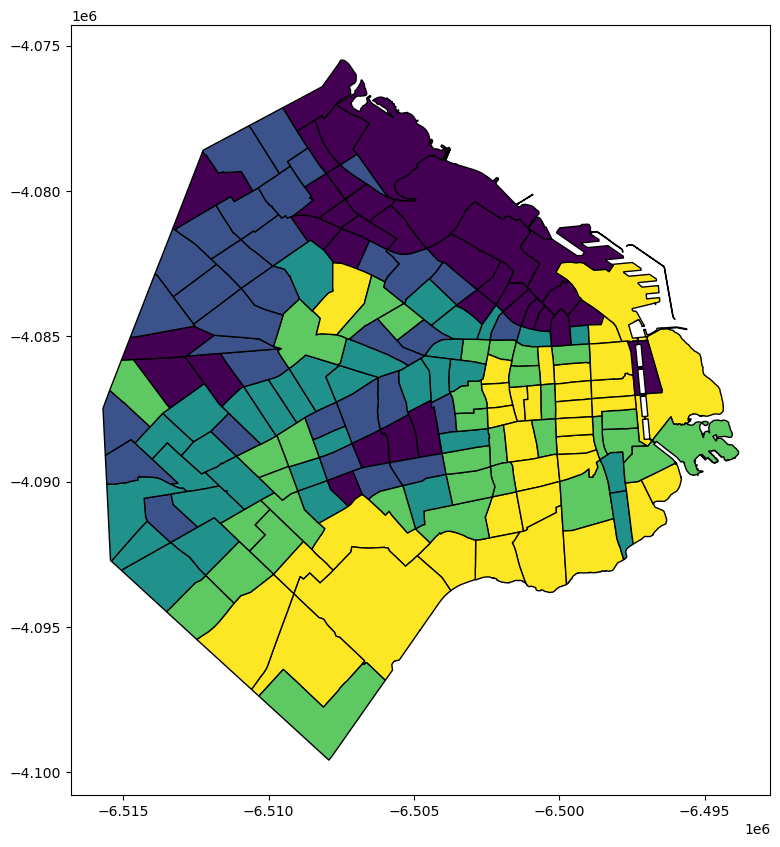

In [65]:
HACINAM = rosetta[["RADIO","INDHAC"]]
HACINAMIENTO = pd.merge(HACINAM,tabla_intermedia,on="RADIO",how="inner")
HACINAMIENTO = HACINAMIENTO[["circuito","INDHAC"]]
HACINAMIENTO_agrupado = HACINAMIENTO.groupby(['circuito']).mean()
HACINAMIENTO_agrupado.reset_index(inplace=True)
HACINAMIENTO_agrupado = HACINAMIENTO_agrupado.rename(columns = {'index':'circuito'})
HACINAMIENTOMERG = pd.merge(circuitos_geometria,HACINAMIENTO_agrupado,on="circuito",how="inner")
HACINAMIENTOMERG.plot(column='INDHAC', scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Hacinamiento/ No

<AxesSubplot:>

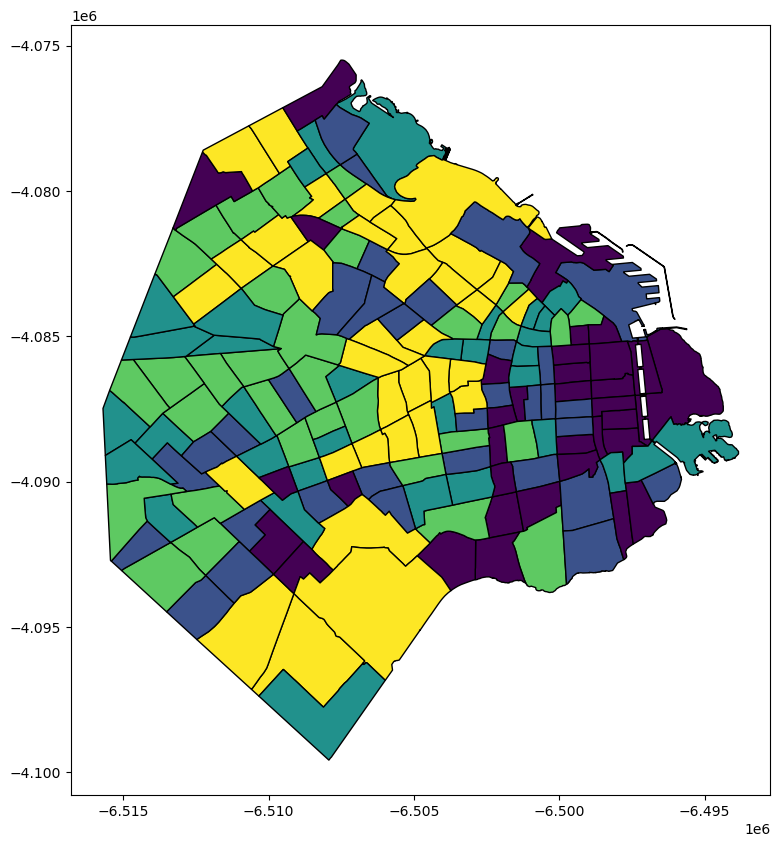

In [66]:
HACINAMIENTO_1 = HACINAMIENTO.loc[HACINAMIENTO["INDHAC"].isin([1,2,3,4])]
HACINAMIENTO_1 = (HACINAMIENTO_1[["circuito", "INDHAC"]]
.groupby(["circuito"])
.count()
)
HACINAMIENTO_1.reset_index(inplace=True)
HACINAMIENTO_1 = HACINAMIENTO_1.rename(columns = {'index':'circuito'})
HACINAMIENTO_1 = pd.merge(circuitos_geometria,HACINAMIENTO_1,on="circuito",how="inner")
HACINAMIENTO_1.plot(column="INDHAC", scheme='quantiles', figsize=(10, 10),edgecolor="k")

##### Hacinamiento/ Sí

<AxesSubplot:>

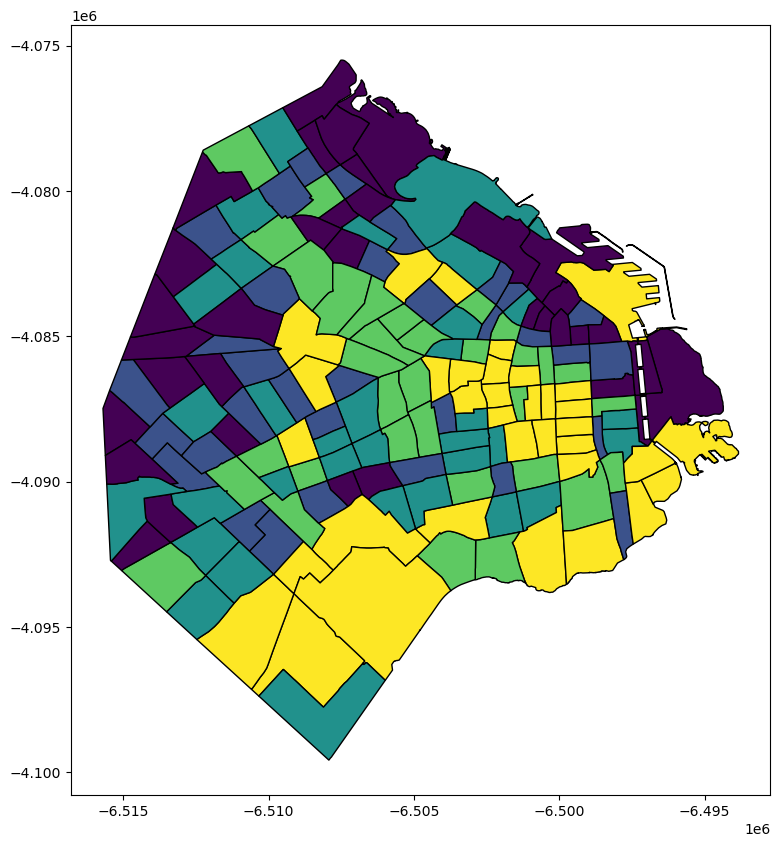

In [67]:
HACINAMIENTO_2 = HACINAMIENTO.loc[HACINAMIENTO["INDHAC"].isin([5,6])]
HACINAMIENTO_2 = (HACINAMIENTO_2[["circuito", "INDHAC"]]
.groupby(["circuito"])
.count()
)
HACINAMIENTO_2.reset_index(inplace=True)
HACINAMIENTO_2 = HACINAMIENTO_2.rename(columns = {'index':'circuito'})
HACINAMIENTO_2 = pd.merge(circuitos_geometria,HACINAMIENTO_2,on="circuito",how="inner")
HACINAMIENTO_2.plot(column="INDHAC", scheme='quantiles', figsize=(10, 10),edgecolor="k")